# **Saudia Arabia Used Car**
---

## Context : 
Arab sebagai salah satu negara penghasil minyak terbesar di dunia membuat harga bahan bakar menjadi lebih murah. Murahnya bahan bakar ini membuat penggunaan kendaaran terutama mobil di Arab Saudi juga semakin tinggi. Tingginya penggunaan mobil ini tentu memicu permintaan pasar terhadap mobil juga semakin masif, terutama mobil bekas. Berdasarkan www.mordorintelligence.com, pasar mobil bekas di Arab Saudi mencapai nilai sebesar USD 4,91 miliar pada tahun 2021 dan diproyeksikan akan terus meningkat nilai hingga USD 8,69 miliar pada tahun 2027. Hal tesebut dilihat dari pertumbuhan CAGR (Compound Annual Growth Rate) yang terus mengalami peningkatan sebesar 7,36% dari hasil proyeksi.

Masifnya permintaan terhadap mobil bekas ini mendorong para pelaku bisnis dalam melahirkan platform online jual beli mobil bekas, misalnya seperti syarah.com. Dengan begitu pelanggan tentunya dapat memilih kriteria mobil yang mereka idamkan. Harga yang ditentukan pun harus sesuai dengan spesifikasi yang dimiliki oleh mobil. Banyaknya mobil bekas yang tersedia dengan beberapa spesifikasi tertentu, membuat penentuan harga mobil terbaik merupakan faktor krusial yang perlu diperhatikan. Penentuan harga terbaik ini diperlukan agar proses jual dan beli mobil bekas menjadi semakin mudah. Apabila harga terlalu tinggi mobil akan sulit terjual, sebaliknya apabila harga terlalu rendah keuntungan yang didapatkan akan lebih kecil. 

## Problem :
Dengan tingginya demand mobil bekas di Arab Saudi, penentuan harga mobil bekas merupakan tantangan yang perlu diatasi bagi syarah.com. Persaingan yang ketat juga membuat penentuan harga mobil bekas yang akurat dan kompetitif menjadi faktor penting untuk melakukan analisa overprice dan underprice dalam pemberian harga mobil bekas. Dengan banyaknya pilihan mobil dengan berbagai spesifikasi dan kondisi, diharapkan perusahaan memiliki model bisnis yang dapat menentukan harga mobil yang kompetitif di pasaran agar banyak pelanggan tertarik untuk membeli mobil pada perusahaan ini. Selain itu pelanggan juga mendapatkan pengalaman terbaik dalam mencari pilihan mobil yang diinginkan sesuai spesifikasi dan harganya. Kemudahan dan harga yang kompetitif inilah yang dapat meningkatkan jumlah pelanggan dan tentu saja meningkatkan pendapatan yang lebih maksimal.

## Goals :
Berdasarkan problem statement diatas, syarah.com harus memiliki tools yang dapat **memprediksi harga mobil bekas sesuai dengan kriteria** dan membantu pelanggan untuk menemukan mobil sesuai dengan apa yang diinginkan. Adapun kriteria-kriteria yang perlu diperhatikan dalam menentukan harga mobil bekas yakni, merk mobil, tipe mobil, gear type, asal mobil, tahun mobil, jarak tempuh, hingga engine size diharapkan dapat **memberikan akurasi yang baik dalam menentukan harga mobil**, yang mana dapat memberikan harga yang kompetitif di pasaran yang terjangkau bagi pelanggan namun tetap menguntungkan bagi perusahaan. Tidak hanya itu, dengan adanya `tool` machine learning ini diharapkan juga mampu memprediksi harga terbaik dengan lebih efisien dan cepat sehingga waktu dan cost yang dihabiskan untuk riset dapat diminimalisir.

## Analytic Approach : 
Dalam hal analytic approach ini, perlu adanya proses menganalisis data untuk menemukan pola dari fitur-fitur (kriteria) yang ada, yang membedakan satu mobil dengan mobil lainnya. Maka dari itu, kita akan membangun suatu model **regresi** yang akan membantu perusahaan untuk dapat menyediakan 'tool' prediksi harga mobil bekas yang baru masuk dalam daftar syarah.com dengan akurat, yang mana akan berguna untuk meningkatkan pendapatan perusahaan. 

## Metric Evaluation : 
Evaluasi metrik yang akan digunakan adalah RMSE, MAE, dan MAPE, di mana :

- RMSE adalah nilai rataan akar kuadrat dari error,
- MAE adalah rataan nilai absolut dari error,
- MAPE adalah rataan persentase error yang dihasilkan oleh model regresi.

Semakin kecil nilai RMSE, MAE, dan MAPE yang dihasilkan, semakin akurat model dalam memprediksi harga mobil bekas dengan mempertimbangkan limitasi fitur yang digunakan. Dua metric utama, yaitu RMSE dan MAE, memiliki perbedaan signifikan. RMSE lebih sensitif terhadap kesalahan besar karena menggunakan kuadrat dari kesalahan, sedangkan MAE menggunakan nilai absolut kesalahan. Dalam konteks prediksi harga mobil bekas, kesalahan besar dapat memiliki dampak finansial yang besar, terutama jika model memprediksi harga yang jauh dari nilai sebenarnya. Oleh karena itu, untuk kasus ini, RMSE lebih relevan karena memberikan perhatian khusus terhadap kesalahan besar yang dapat menyebabkan kerugian yang signifikan bagi pengguna model, terutama jika digunakan untuk menentukan harga jual mobil bekas. Sehingga, RMSE memberikan gambaran yang lebih akurat tentang seberapa baik model memprediksi harga mobil bekas. 

## Data Undertanding : 
Dataset ini berisi 5624 data mobil bekas yang diambil dari syarah.com, Berikut beberapa features datanya : 

| Attribute    | Description                                | Data Type  |
|--------------|--------------------------------------------|------------|
| Type         | Type of used car.                          | object     |
| Region       | The region in which the used car was offered for sale. | object |
| Make         | The company name.                          | object     |
| Gear_Type    | Gear type size of used car.                | object     |
| Origin       | Origin of used car.                        | object     |
| Options      | Options of used car.                       | object     |
| Year         | Manufacturing year.                        | int64      |
| Engine_Size  | The engine size of used car.               | float64    |
| Mileage      | Mileage of used car.                       | int64      |
| Negotiable   | True if the price is 0, that means it is negotiable. | bool |
| Price        | Used car price.                            | int64      |


In [1]:
# Data manipulation 
import pandas as pd 
import numpy as np 

# Visualization
import matplotlib.pyplot as plt 
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Load Dataset

In [2]:
df = pd.read_csv('data_saudi_used_cars.csv')
df

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
1,Yukon,Riyadh,GMC,Automatic,Saudi,Full,2014,8.0,80000,False,120000
2,Range Rover,Riyadh,Land Rover,Automatic,Gulf Arabic,Full,2015,5.0,140000,False,260000
3,Optima,Hafar Al-Batin,Kia,Automatic,Saudi,Semi Full,2015,2.4,220000,False,42000
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5619,X-Trail,Jeddah,Nissan,Automatic,Saudi,Standard,2018,2.5,78794,False,68000
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0
5621,Yukon,Dammam,GMC,Automatic,Saudi,Full,2016,5.3,48000,False,145000
5622,RX,Dammam,Lexus,Automatic,Gulf Arabic,Full,2016,2.5,81000,False,154000


In [3]:
display(df.describe(), df.describe(include='O'))

,Year,Engine_Size,Mileage,Price
count,5624.000000,5624.000000,5.624000e+03,5624.000000
mean,2014.101885,3.295430,1.509234e+05,53074.058144
std,5.791606,1.515108,3.828360e+05,70155.340614
min,1963.000000,1.000000,1.000000e+02,0.000000
25%,2012.000000,2.000000,3.800000e+04,0.000000
50%,2016.000000,3.000000,1.030000e+05,36500.000000
75%,2018.000000,4.500000,1.960000e+05,72932.500000
max,2022.000000,9.000000,2.000000e+07,850000.000000


,Type,Region,Make,Gear_Type,Origin,Options
count,5624,5624,5624,5624,5624,5624
unique,347,27,58,2,4,3
top,Land Cruiser,Riyadh,Toyota,Automatic,Saudi,Full
freq,269,2272,1431,4875,4188,2233


## Data Preprocessing

Pada tahap Data preprocessing, akan dilakukan sebuah cleaning pada dataset dan disesuaikan dengan kebutuhan analisis nantinya, Berikut beberapa aspek yang perlu dilihat untuk melakukan proses cleaning: 
1. Melakukan pengecekan apakah terdapat data duplikat, missing values, dan melakukan dropping feature yang tidak memiliki relevansi dengan permodelan nantinya. 
2. setelah melakukan pengecekan, selanjutnya merupakan proses treatment terhadap missing values dengan cara imputing (jika ada).

In [4]:
# Mengecek Missing Values pada data
df.isna().sum()

Type           0
Region         0
Make           0
Gear_Type      0
Origin         0
Options        0
Year           0
Engine_Size    0
Mileage        0
Negotiable     0
Price          0
dtype: int64

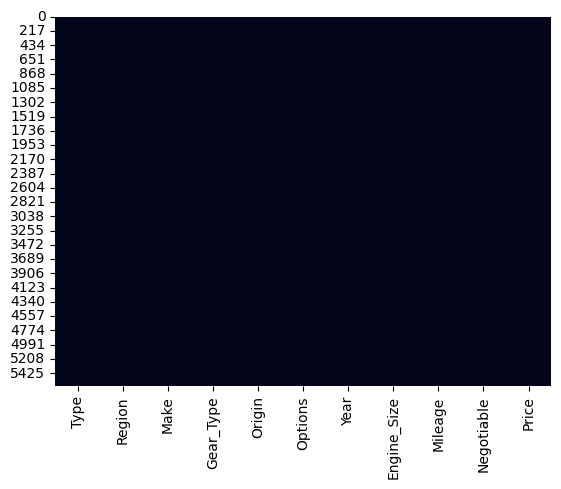

In [5]:
# Missing value heatmap
sns.heatmap(df.isnull(), cbar=False);

Setelah melakukan pengecekan ternyata tidak ada data yang kosong didalamnya maka dari itu tidak akan ada treatment yang dilakukan disini.

In [6]:
# Check data apakah ada yang duplikat atau tidak 
print("Total baris duplicate:", df.duplicated().sum())

Total baris duplicate: 4


Setelah melakukan pengecekan terhadap data duplikat ternyata terdapat 4 data yang terindikasi duplikat didalamanya, maka dari itu treatment yang dilakukan adalah dropping column duplikat.

In [7]:
# Drop data duplikat
df = df.drop_duplicates()

In [8]:
describe = pd.DataFrame(
    {
    'Features/Column': df.columns.values,
    'data_type': df.dtypes.values,
    'unique_value': df.nunique().values,
    'sample_unique': [df[col].unique() for col in df.columns]
    })
describe

,Features/Column,data_type,unique_value,sample_unique
0,Type,object,347,"[Corolla, Yukon, Range Rover, Optima, FJ, CX3,..."
1,Region,object,27,"[Abha, Riyadh, Hafar Al-Batin, Aseer, Makkah, ..."
2,Make,object,58,"[Toyota, GMC, Land Rover, Kia, Mazda, Porsche,..."
3,Gear_Type,object,2,"[Manual, Automatic]"
4,Origin,object,4,"[Saudi, Gulf Arabic, Other, Unknown]"
5,Options,object,3,"[Standard, Full, Semi Full]"
6,Year,int64,50,"[2013, 2014, 2015, 2020, 2019, 2012, 2016, 199..."
7,Engine_Size,float64,71,"[1.4, 8.0, 5.0, 2.4, 4.0, 2.0, 4.8, 3.5, 4.6, ..."
8,Mileage,int64,1716,"[421000, 80000, 140000, 220000, 49000, 25000, ..."
9,Negotiable,bool,2,"[True, False]"


In [9]:
df[df['Price']== 0]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,True,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,True,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,True,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,True,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,True,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0


### Dropping Features 

Mari sekarang melakukan pengecekan terhadap kolom `Negotiable`

In [10]:
display(df[df['Negotiable']== False], df[df['Negotiable']== True])

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
1,Yukon,Riyadh,GMC,Automatic,Saudi,Full,2014,8.0,80000,False,120000
2,Range Rover,Riyadh,Land Rover,Automatic,Gulf Arabic,Full,2015,5.0,140000,False,260000
3,Optima,Hafar Al-Batin,Kia,Automatic,Saudi,Semi Full,2015,2.4,220000,False,42000
5,CX3,Abha,Mazda,Automatic,Saudi,Semi Full,2019,2.0,25000,False,58000
6,Cayenne S,Riyadh,Porsche,Automatic,Saudi,Full,2012,4.8,189000,False,85000
...,...,...,...,...,...,...,...,...,...,...,...
5616,CX9,Qassim,Mazda,Automatic,Saudi,Full,2020,2.0,9500,False,132000
5618,Suburban,Riyadh,GMC,Automatic,Saudi,Full,2006,5.3,86000,False,50000
5619,X-Trail,Jeddah,Nissan,Automatic,Saudi,Standard,2018,2.5,78794,False,68000
5621,Yukon,Dammam,GMC,Automatic,Saudi,Full,2016,5.3,48000,False,145000


,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,True,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,True,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,True,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,True,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,True,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0


Berdasarkan hasil Explorasi data diatas dapat disimpulkan jika kolom `Negotiable` mempengaruhi kolom harga, yang dimana kolom `Negotiable` jika bernilai `True` maka `Price` menjadi 0, dari sini bisa diasumsikan jika mobil bekas yang dapat dinegosiasi harganya tidak masuk dalam catatan.  Memasukan fitur ini dalam model dapat memberikan terlalu banyak informasi dan mengakibatkan overfitting. Overfitting terjadi ketika model menjadi terlalu kompleks dan menangkap pola yang tidak relevan dari data latihan sebelumnya, sehingga menghasilkan kinerja yang buruk pada data yang belum pernah dilihat sebelumnya. Karena features/ kolom `Negotiable` terkait dengan proses negosiasi dan mungkin tidak memiliki dampak signifikan pada harga sebenarnya dari mobil bekas kita akan menghapus fitur `Negotiable` tersebut.

Dengan begitu kolom `Negotiable` sebaiknya di drop dengan asumsi tidak memiliki relevansi terhadap kepentingan modeling untuk memprediksi harga nantinya. Kolom `Negotiable` ini hanya menerangkan apakah harga mobil tersebut dapat di negosiasi atau tidak.

In [11]:
df = df.drop(columns='Negotiable')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5620 entries, 0 to 5623
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         5620 non-null   object 
 1   Region       5620 non-null   object 
 2   Make         5620 non-null   object 
 3   Gear_Type    5620 non-null   object 
 4   Origin       5620 non-null   object 
 5   Options      5620 non-null   object 
 6   Year         5620 non-null   int64  
 7   Engine_Size  5620 non-null   float64
 8   Mileage      5620 non-null   int64  
 9   Price        5620 non-null   int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 483.0+ KB


Kolom `Negotiable` sudah didrop

### Checking Anomaly

In [13]:
df.describe()

,Year,Engine_Size,Mileage,Price
count,5620.000000,5620.000000,5.620000e+03,5620.000000
mean,2014.100356,3.296299,1.509222e+05,53086.404448
std,5.793003,1.515253,3.829633e+05,70175.153207
min,1963.000000,1.000000,1.000000e+02,0.000000
25%,2012.000000,2.000000,3.800000e+04,0.000000
50%,2016.000000,3.000000,1.030000e+05,36500.000000
75%,2018.000000,4.500000,1.960000e+05,73000.000000
max,2022.000000,9.000000,2.000000e+07,850000.000000


1. Dari hasil deskripsi tersebut, kolom `price` terlihat memiliki harga terkecil sebesar 0 dari sini dapat disimpulkan jika harga 0 ini tidak masuk akal dan akan dilakukan treatment drop. Dropping rows dengan price nol ini di harapkan mampu membantu dalam proses pemodelan nantinya sehingga tidak mengaggu dalam model prediksi `Price` nantinya. 

2. Selanjutnya pada kolom `Mileage` terdapat anomali data yakni terdapat nilai tertinggi sebesar **20.000.000** yang dimana hasil ini sangat tidak masuk akal didalam total kilometer (Extreme outlier) di suatu kendaraan, berdasarkan https://www.dmv.virginia.gov/ maksimal dari odometer (jarak tempuh suatu kendaraan) adalah 999.999. Jadi dapat diasumsikan jika mobil dengan maksimal **20.000.000** maka bisa dilakukan treatment drop kolom/feature.

In [14]:
df[df['Price'] == 0]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,0
...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,0


Jika dilihat dari tabel diatas, feature `Price` yang memiliki value 0 sebanyak 1796 maka kita akan drop kolom tersebut dengan alasan yang sudah dijelaskan sebelumnya.

Pemberlakuan drop pada kolom `Price` yang memiliki value 0 ini juga diperkuat dengan alasan, bahwa ketika suatu mobil bekas di Arab dapat dinegosiasi maka harga tidak ditampilkan pada data set ini. jadi harga = 0 bukan merupakan suatu variasi dalam data melainkan tidak adanya catatam harga pada mobil-mobil yang bisa di negosiasi. pemberlakuan drop ini juga membantu model prediksi dalam harga untuk lebih akurat dalam menentukan harga, akan tetapi memiliki limitasi tertentu dalam pemberian harganya.

In [15]:
df = df[df['Price'] != 0]

In [16]:
df[df['Price'] == 0]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price


Feature/kolom `Price` sudah dibersihkan, selanjutnya drop `Mileage`

In [17]:
df[df['Mileage'] > 999999]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
110,Optra,Riyadh,Chevrolet,Automatic,Saudi,Standard,2007,1.6,2000000,5000
333,Range Rover,Jeddah,Land Rover,Automatic,Saudi,Full,2009,2.4,2013000,35000
453,Azera,Riyadh,Hyundai,Automatic,Saudi,Semi Full,2018,3.5,1100000,80000
572,Camry,Yanbu,Toyota,Automatic,Other,Full,1998,2.5,4500000,15000
915,Pathfinder,Riyadh,Nissan,Automatic,Saudi,Standard,1998,3.5,3180003,10500
1334,Prado,Makkah,Toyota,Manual,Saudi,Semi Full,2006,4.0,2800000,35000
1412,Trailblazer,Jeddah,Chevrolet,Automatic,Other,Full,2004,5.3,3500000,10000
2115,Optima,Riyadh,Kia,Automatic,Saudi,Full,2014,2.5,2002500,42000
3292,Aveo,Makkah,Chevrolet,Automatic,Other,Semi Full,2014,1.6,1500000,11000
3387,Fusion,Hail,Ford,Automatic,Saudi,Full,2010,2.5,3000000,17000


terdapat 12 baris yang memiliki value dengan `Mileage` lebih dari 999.999 Km

In [18]:
# Melakukan filtering data pada featrue Milegae
df = df[df['Mileage'] < 999999]

Pemberlakuan Filtering di feature `Milegage` sudah berhasil terhandle. Dengan begini asumsi awal Milegae yang melebihi odometer mampu membantu dalam memprediksi harga agar lebih akurat berdasarkan limitasi ini tentunya.  

In [19]:
df.describe()

,Year,Engine_Size,Mileage,Price
count,3808.000000,3808.000000,3808.000000,3808.000000
mean,2014.878939,3.181040,127662.132090,78223.501313
std,5.092297,1.459574,110751.635224,72808.892419
min,1963.000000,1.000000,100.000000,1.000000
25%,2013.000000,2.000000,48000.000000,35000.000000
50%,2016.000000,2.700000,102111.000000,58000.000000
75%,2018.000000,4.000000,181000.000000,95000.000000
max,2021.000000,9.000000,900000.000000,850000.000000


In [20]:
df[df['Price'] < 5000].sort_values(by= 'Price')

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
3131,Yukon,Jubail,GMC,Automatic,Saudi,Full,2019,5.3,50000,1
3992,G80,Riyadh,Genesis,Automatic,Other,Semi Full,2018,3.8,170000,500
4399,Yaris,Riyadh,Toyota,Automatic,Saudi,Standard,2018,1.5,100000,850
5128,Rio,Arar,Kia,Automatic,Saudi,Standard,2019,1.4,55500,884
3474,Yaris,Najran,Toyota,Automatic,Saudi,Standard,2019,1.6,85000,950
...,...,...,...,...,...,...,...,...,...,...
5009,Expedition,Al-Jouf,Ford,Automatic,Saudi,Full,2003,5.4,400000,4000
5121,Accent,Qassim,Hyundai,Manual,Saudi,Standard,2008,1.6,250000,4000
5521,Suburban,Al-Medina,Chevrolet,Automatic,Other,Semi Full,1997,6.0,292764,4000
4705,Caprice,Riyadh,Chevrolet,Automatic,Other,Full,1995,5.5,252,4500


Setelah melakukan digging informtion dari website, yang menjual mobil bekas dengan harga terendah di tahun 2023 sekitar 5.000 SAR, harga ini merupakan harga rata-rata terendah mobil bekas di arab saudi. Saya disini menggunakan sumber dari https://ksa.yallamotor.com/used-cars/pr_1000_2000, sebagai salah satu Saudi Arabia Used Car Market Leaders Source: https://www.mordorintelligence.com/industry-reports/saudi-arabia-used-car-market, dan dapat dijadikan acuan dalam melakukan pembatasan harga terendah pada data set ini.

Pada data ditunjukan jika terdapat 68 baris harga mobil bekas yang masih dibawah 10.000, ini merupakan anomaly data yang juga menyebabkan outlier. maka dari itu kita akan melakukan drop baris tersebut.

In [21]:
df = df[df['Price'] >= 5000]

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3740 entries, 1 to 5622
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         3740 non-null   object 
 1   Region       3740 non-null   object 
 2   Make         3740 non-null   object 
 3   Gear_Type    3740 non-null   object 
 4   Origin       3740 non-null   object 
 5   Options      3740 non-null   object 
 6   Year         3740 non-null   int64  
 7   Engine_Size  3740 non-null   float64
 8   Mileage      3740 non-null   int64  
 9   Price        3740 non-null   int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 321.4+ KB


Berikut merupakan hasil final setelah melakukan pembersihan pada anomaly data. selanjutnya adalah melihat tentang sebaran data serta outlier dengan metode iqr di di setiap feature numericnya. Ketika terindikasi data tidak terdistribusi tidak normal atau memiliki skewness yang cukup tinggi maka perlu dilakukan rekayasa di setiap fitur dengan cara mengurangi skewnessnya tersebut.


### Checking Outlier

adanya outlier pada data tentu memiliki pengaruh dalam kelangsungan analisis serta pemodel yang akan digunakan nantinya. pada tahap ini saya akan melakukan pengecekan outlier serta  mempertimbangkan treatement yang sesuai untuk data nantinya dengan domain knowledge juga.  

Text(0.5, 1.0, 'Boxplot on Numeric Feature')

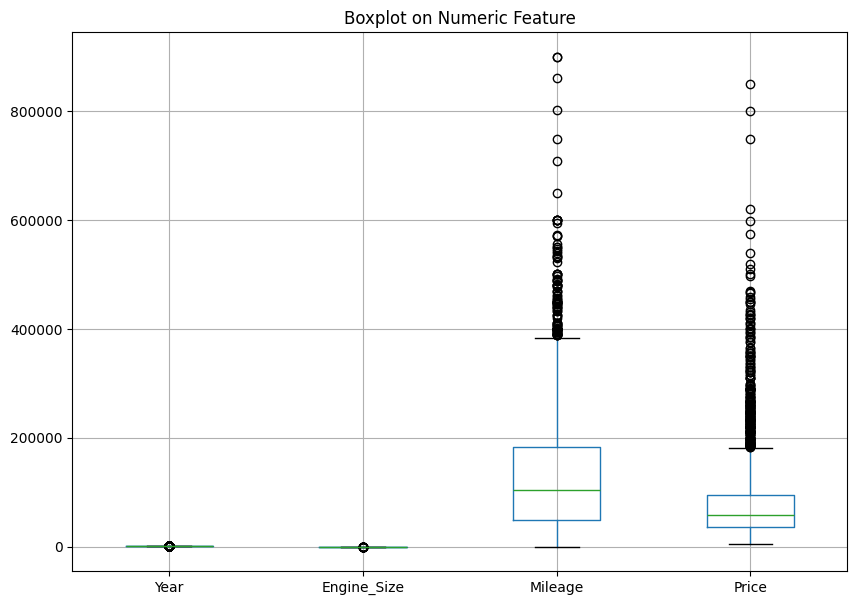

In [23]:
plt.figure(figsize=(10,7))
df.boxplot()
plt.title('Boxplot on Numeric Feature')

Note : 
* setelah diidentifikasi terdapat outlier pada feature numerik di atas. Outlier disini hanya difokuskan pada kolom `Mileage` dan `Price` saja. Kenapa ? jika dilihat secara mendalam outlier pada kolom `year` serta `engine_size` disini tidak diberlakukan treatment karena data-data tersebut merupakan jenis data yang memberikan variasi informasi untuk membantu dalam proses modeling dalam meprediksi harga. 

* pemberian treatmen ini tentunya juga akan mempegaruhi model yang dihasilkan hanya terbatas dapat memprediksi listing baru yang nilai-nilainya pada rentang data berdasarkan data set yang sudah melalui cleaning proses. Di luar rentang data ini, hasil prediksi dari model akan menjadi bias.

Sekarang mari kita lihat bagaimana scatter plot dan regression plot dari feature `Mileage` dan `Price`..

Text(0.5, 1.0, 'Regression Plot Mileage dan Price')

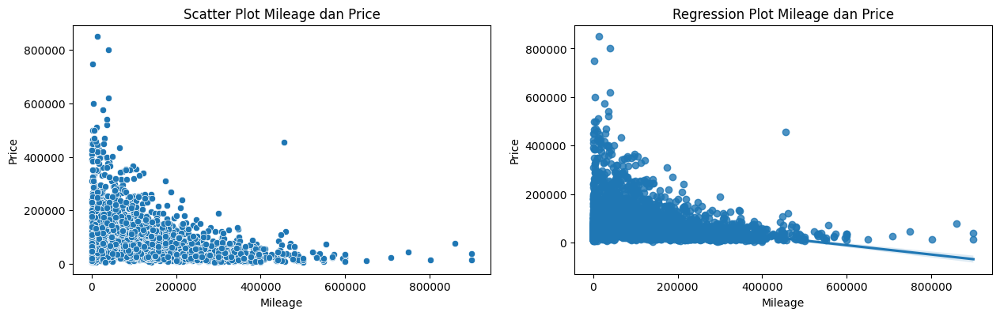

In [24]:
# Scatter plot antara Mileage dan Price
plt.figure(figsize=(15,9))
plt.subplot(2,2,1)
sns.scatterplot(data=df, x= 'Mileage', y="Price")
plt.title('Scatter Plot Mileage dan Price')

plt.subplot(2,2,2)
sns.regplot(data=df, x= 'Mileage', y="Price")
plt.title('Regression Plot Mileage dan Price')


Berdasarkan hasil pengecekan tersebut visual diatas dapat ditarik sebuah kesimpulan jika data yang terindikasi outlier tersebut akan merusak garis regresi. Dengan begitu saya melakukan drop data outlier dengan menggunakan IQR.  

In [25]:
# Function for checking outliers
def find_anomalies(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    limit = iqr*1.5
    print(f'IQR: {iqr}')

    limit_bawah = q1 - limit
    limit_atas = q3 + limit
    print(f'limit_bawah: {limit_bawah}')
    print(f'limit_atas: {limit_atas}')        

In [26]:
for col in df.describe().columns:
    print(f"Kolom: {col}")
    find_anomalies(df[col])
    print("----------------")

Kolom: Year
IQR: 5.0
limit_bawah: 2005.5
limit_atas: 2025.5
----------------
Kolom: Engine_Size
IQR: 2.0
limit_bawah: -1.0
limit_atas: 7.0
----------------
Kolom: Mileage
IQR: 134000.0
limit_bawah: -152000.0
limit_atas: 384000.0
----------------
Kolom: Price
IQR: 58500.0
limit_bawah: -51250.0
limit_atas: 182750.0
----------------


### Kolomn `Price`

In [27]:
df['Price'].describe()

count      3740.000000
mean      79613.078342
std       72728.051902
min        5000.000000
25%       36500.000000
50%       59000.000000
75%       95000.000000
max      850000.000000
Name: Price, dtype: float64

In [28]:
len(df[df['Price'] > 182750])

261

Terlihat bahwa  92,97% data pada kolom price bernilai kurang dari 182.750 SAR, dengan nilai maksimal 850.000. Terdapat skewness pada distribusinya, yaitu tail yang memanjang di sebelah kanan (positive skewness).

Terdapat 261 atau 7,03 % dari total data yang nilai price-nya lebih besar dari 182.750 (Limit atas sesuai metode IQR). Oleh karena itu data yang memiliki nilai price > 182.750 tidak akan dimasukkan ke dalam pemodelan, sehingga skewness-nya pun akan berkurang. Hal ini tentu akan menjadi limitasi untuk model yang nantinya dibangun.

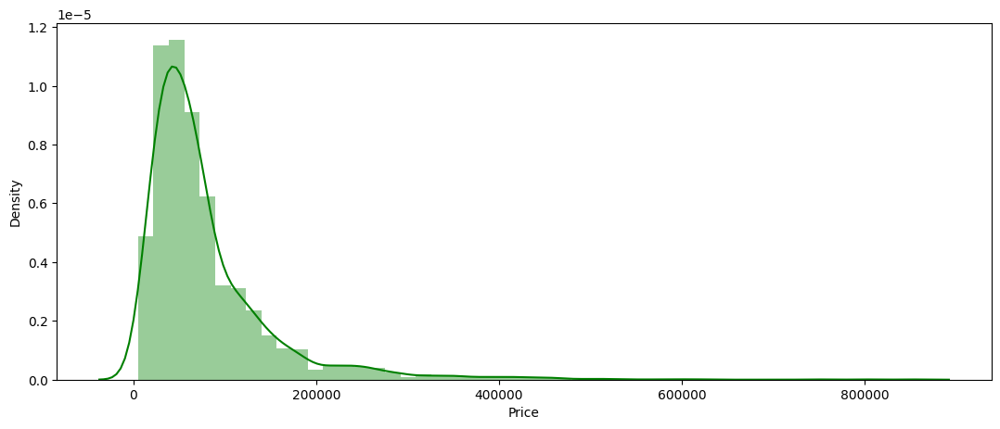

In [29]:
# Sebelum Filtering 
plt.figure(figsize=(13,5))
sns.distplot(df['Price'], color= 'green');

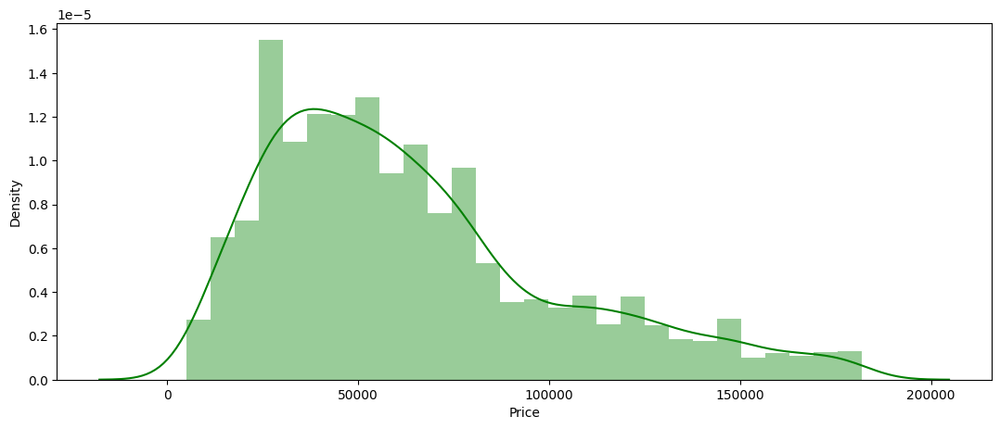

In [30]:
# Melakukan filtering pada data
df = df[(df['Price'] <= 182750)]

# After filtering
plt.figure(figsize=(13,5))
sns.distplot(df['Price'], color= 'green');

### Kolom `Mileage`


In [31]:
df['Mileage'].describe()

count      3479.00000
mean     134236.22449
std      112156.03370
min         100.00000
25%       55000.00000
50%      109191.00000
75%      190000.00000
max      900000.00000
Name: Mileage, dtype: float64

In [32]:
df.sort_values(by='Mileage', ascending=0, inplace=True)
df.head(7)

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
1957,Hilux,Jeddah,Toyota,Manual,Saudi,Full,1995,2.7,900000,14000
578,Copper,Qassim,MINI,Manual,Saudi,Full,1998,2.0,900000,40000
4606,Maxima,Riyadh,Nissan,Automatic,Saudi,Full,2017,1.0,860000,77000
2427,Corolla,Riyadh,Toyota,Manual,Saudi,Standard,2005,1.3,801500,14000
2493,Innova,Riyadh,Toyota,Automatic,Gulf Arabic,Standard,2015,2.7,749000,46000
4603,Land Cruiser,Tabouk,Toyota,Manual,Saudi,Full,1997,4.5,708000,25000
536,Datsun,Riyadh,Nissan,Manual,Other,Full,1998,2.4,650000,12000


Walapupun terdapat outlier dari kolom `Mileage`, jika kita lihat pada boxplot sebelumnya, perlu kita analisa lebih jauh dan mempertimbangkan domain knowledge untuk melakukan treatment pada kolom ini. Mileage/ Kilometer pada mobil tentu akan berkaitan dengan variabel lain dalam data (Mileage, Type, Make, GearType, dan Options) karena masih memungkinkan adanya penjualan mobil dengan harga tersebut. Terdapat variasi nilai yang cukup besar di bawah rata-rata tahun dalam data ini dan nilai masih dapat diterima sebagai bentuk variasi dalam modelling nantinya.

Maka dari itu, tidak ada treatment yang dilakukan pada feature ini walaupun memiliki outlier. Namun data yang tidak masuk akal di feature ini sudah dibersihkan di proses sebelumnya. 

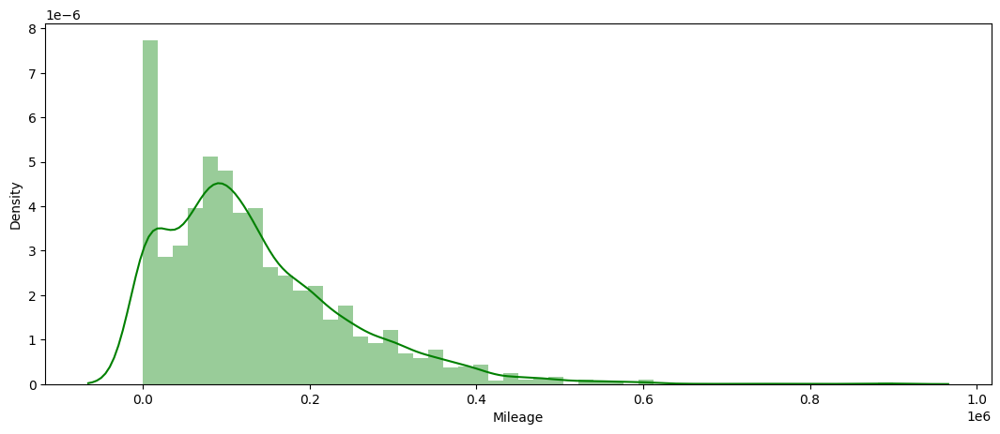

In [33]:
# Sebaran data pada kolom Mileage
plt.figure(figsize=(13,5))
sns.distplot(df['Mileage'], color= 'green');

Sebaran ini menunjuka jika data memiliki skewness pada distribusinya, yaitu tail yang memanjang di sebelah kanan (positive skewness), dengan sebagian besar mobil bekas memiliki jarak tempuh kurang lebih di bawah 400.000 kilometer.

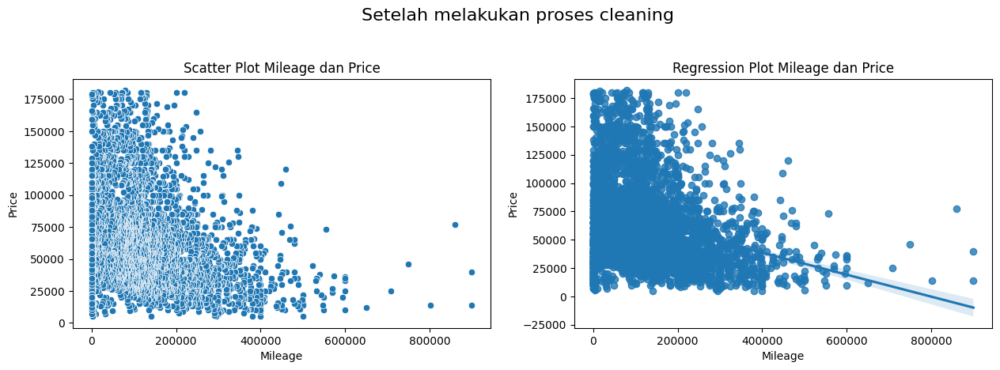

In [34]:
# Scatter plot antara Mileage dan Price
plt.figure(figsize=(15,9))
plt.subplot(2,2,1)
sns.scatterplot(data=df, x= 'Mileage', y="Price")
plt.title('Scatter Plot Mileage dan Price')

plt.subplot(2,2,2)
sns.regplot(data=df, x= 'Mileage', y="Price")
plt.title('Regression Plot Mileage dan Price')

plt.suptitle('Setelah melakukan proses cleaning', fontsize=16);

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3479 entries, 1957 to 5001
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         3479 non-null   object 
 1   Region       3479 non-null   object 
 2   Make         3479 non-null   object 
 3   Gear_Type    3479 non-null   object 
 4   Origin       3479 non-null   object 
 5   Options      3479 non-null   object 
 6   Year         3479 non-null   int64  
 7   Engine_Size  3479 non-null   float64
 8   Mileage      3479 non-null   int64  
 9   Price        3479 non-null   int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 299.0+ KB


Pada akhirnya, tersisa 3.479 baris data dari sebelumnya 5.624 baris data yang akan digunakan untuk pemodelan. Ini berarti terdapat 2.145 baris data atau 38,14% data sudah tereliminasi sesuai dengan asumsi dan argumen yang disampaikan di proses-proses sebelumnya.

### Checking Correlation 

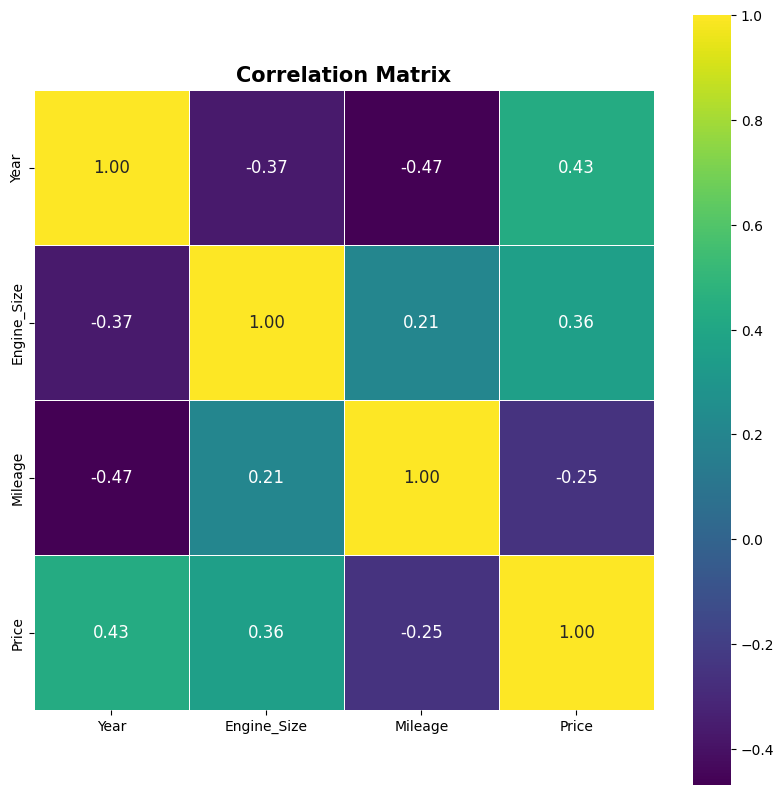

In [36]:
plt.figure(figsize=(10, 10))
palette = sns.diverging_palette(20, 220, n=256)
corr = df[['Year','Engine_Size','Mileage','Price']].corr(method='spearman') # Penggunaan Spearmen karena data tidak terdistribusi dengan normal
sns.heatmap(corr, annot=True, fmt='.2f', cmap="viridis", square=True, linewidths=.5,
            annot_kws={"fontsize": 12})  # Mengatur ukuran tulisan bobot
plt.title('Correlation Matrix', size=15, weight='bold')
plt.show()

Berdasarkan matriks korelasi yang diberikan, dapat disimpulkan bahwa terdapat hubungan yang signifikan/Kuat antara feature `Year` dan  feature `Engine_Size` dengan target `Price`. Hubungan tersebut dapat digunakan untuk memprediksi harga mobil bekas berdasarkan karakteristik-karakteristik tersebut.

Sekarang mari kita lihat **Muticolinearitasnya**..

Multikolinearitas adalah suatu kondisi dimana dua atau lebih variabel bebas dalam sebuah model regresi linear berganda memiliki korelasi yang sangat tinggi. Korelasi yang tinggi ini dapat menyebabkan masalah dalam model regresi nanti yang akan dibuat. Dalam konteks ini, kita perlu memeriksa apakah ada korelasi tinggi antara fitur-fitur lain dalam dataset yang dapat mempengaruhi interpretasi model. 

Menggunakan metode VIF (Variance Inflation Factor). VIF adalah ukuran yang menunjukkan seberapa besar varians koefisien regresi dipengaruhi oleh variabel bebas lainnya. Jika VIF suatu variabel bebas tinggi, maka kemungkinan besar terdapat multikolinearitas.

In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    vif = pd.DataFrame()
    vif['variables'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

calc_vif(df[['Year','Engine_Size','Mileage','Price']])

,variables,VIF
0,Year,8.363965
1,Engine_Size,6.886905
2,Mileage,2.898615
3,Price,4.780769


berdasarkan www.statsmodels.org, nilai VIF dihitung untuk setiap variabel independen dalam model. VIF yang melebihi 5 dianggap sebagai indikator multikolinearitas yang tinggi. Artinya, variabel independen tersebut memiliki korelasi yang kuat dengan variabel independen lainnya dan dapat menyebabkan estimasi parameter yang tidak stabil dan kurang akurat. kita diharapkan untuk menghapus fitur tersebut dari model karena kemungkinan besar fitur tersebut memiliki korelasi tinggi dengan fitur lain dalam dataset.

Namun, semua itu juga tergantung dalam konteks dataset, Memang sebaiknya tidak menghapus fitur-fitur yang memiliki nilai VIF lebih dari 5, yaitu `Year` dan `Engine_Size`, meskipun ada indikasi multicollinearity. Hal ini dikarenakan feature tersebut memiliki pengaruh yang signifikan terhadap penentuan harga jual mobil bekas.

Dalam beberapa kasus, meskipun terdapat multicollinearity, feature tersebut masih memiliki nilai informatif yang penting dalam memprediksi variabel target. Dalam konteks ini, `Year` dan `Engine_Size` mungkin memberikan informasi penting tentang nilai mobil bekas dan preferensi konsumen yang dilihat dari ukuran mesin dan tahun mobil ini diproduksi. Oleh karena itu, meskipun terdapat multicollinearity, kita sebaiknya mempertahankan fitur-fitur tersebut dalam model.

Note : 
* Perlu digarisbawahi adanya multicolinearity dapat mempengaruhi hasil interpretasi juga nantinya. Oleh karena itu, saat analisa model nantinya, kita perlu berhati-hati dalam menafsirkan kontribusi variabel independent terhadap variabel dependent.

#### **Setelah melakukan Data preprocessing pada Feature dengan type numeric selanjutnya merupakan Explorasi data dengan type Category..**

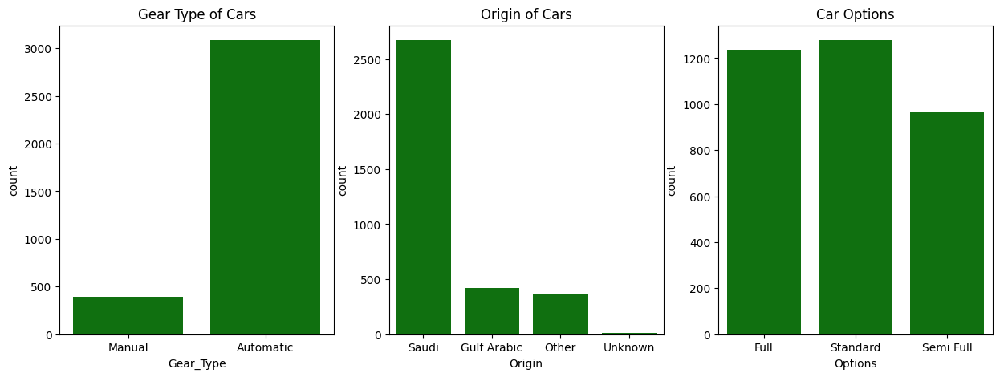

In [38]:
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
sns.countplot(x = df['Gear_Type'],color= 'green')
plt.title('Gear Type of Cars')

plt.subplot(1,3,2)
sns.countplot(x = df['Origin'],color= 'green')
plt.title('Origin of Cars')

plt.subplot(1,3,3)
sns.countplot(x = df['Options'],color= 'green')
plt.title('Car Options')

plt.show()

Insight : 
1. Berdasarkan **Gear_Type** mobil bekas dengan transmisi **otomatis** merupakan mobil yang paling sering laku di pasaran, hal tersebut diasumsikan mobil dengan transmisi otomatis lebih mudah dikendarai dari pada manual.
2. Jika dilihat dari **Origin**, mobil yang paling laku di pasaran adalah mobil yang berasal dari **Saudi** dibanding daerah lainnya.
3. Selanjutnya adalah kolom **Options**, dimana kolom ini merupakan kolom yang menjelaskan apakah mobil merupakan hasil dari modifikasi atau tidak. jika dilihat dari totalnya adlaah mobil dengan modifikasi standard/ tidak dimodifikasi merupakan mobil bekas yang paling laris di pasaran Arab Saudi.

**Sekarang mari kita lihat bagaimana masing-masing features dengan target**

''

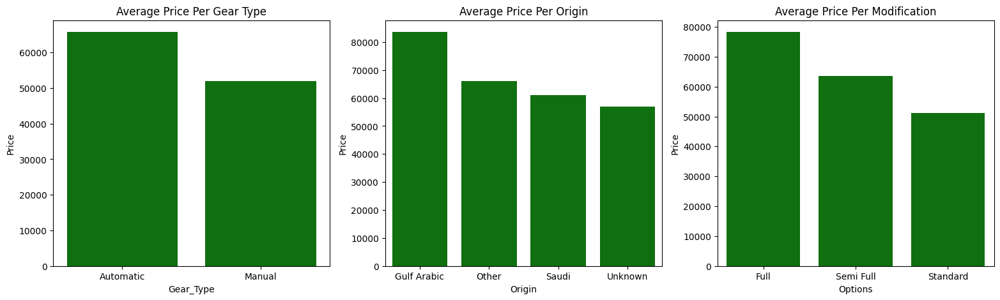

In [39]:
geartype_avgpr = df.groupby('Gear_Type')[['Price']].mean().sort_values(by = 'Price', ascending= False )
origin_avgpr = df.groupby('Origin')[['Price']].mean().sort_values(by = 'Price', ascending= False )
options_avgpr = df.groupby('Options')[['Price']].mean().sort_values(by = 'Price', ascending= False )

plt.figure(figsize=(19,5))

plt.subplot(1,3,1)
sns.barplot(geartype_avgpr['Price'],color= 'green')
plt.title('Average Price Per Gear Type')

plt.subplot(1,3,2)
sns.barplot(origin_avgpr['Price'],color= 'green')
plt.title('Average Price Per Origin')

plt.subplot(1,3,3)
sns.barplot(options_avgpr['Price'],color= 'green')
plt.title('Average Price Per Modification')
;

Insight : <br>
Berdasarkan grafik diatas dapat di identifikasi
- Rata-rata harga mobil bekas bertransmisi otomatis lebih tinggi daripada mobil bekas bertransmisi manual. 
- Rata-rata harga mobil bekas asal Gulf Arabic lebih tinggi daripada yang lain.
- Rata-rata harga mobil bekas dengan full modifikasi lebih tinggi daripada mobil bekas dengan modifikasi semi full atau standard. 

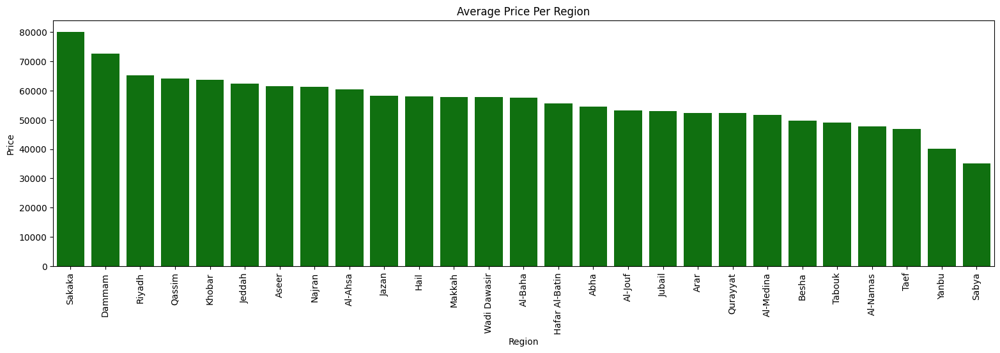

In [40]:
region_avgpr = df.groupby('Region')[['Price']].mean().sort_values(by = 'Price', ascending= False )

plt.figure(figsize=(19,5))
sns.barplot(region_avgpr['Price'],color= 'green')
plt.title('Average Price Per Region')
plt.xticks(rotation = 90);

Insight : 
- jika dilihat-lihat Sakaka dan Damam merupakan daerah atau Region yang memiliki rata-rata harga penjualan mobil diatas 70.000 SAR. Dapat diasumsikan jika mobil-mobil didaerah ini merupakan mobil bekas yang berkualitas baik atau mewah.

Sekarang mari kita lihat dengan jenis merk mobilnya

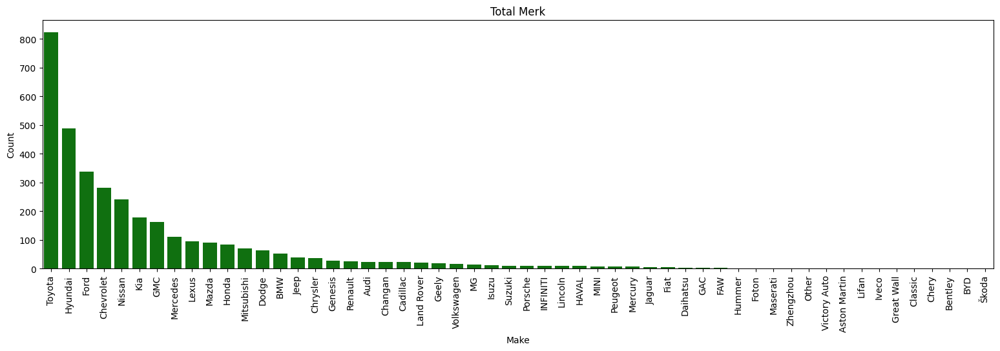

In [41]:
make_count = df.groupby('Make')[['Gear_Type']].count().sort_values(by= 'Gear_Type',ascending = False).reset_index()
make_count
plt.figure(figsize=(19,5))
sns.barplot(data = make_count , y ='Gear_Type', x = 'Make',color= 'green')
plt.ylabel('Count')
plt.title('Total Merk')
plt.xticks(rotation = 90);

Insight : 
* Toyota merupakan mobil bekas paling sering terjual di Saudi Arabia, dibandingkan lainnya.

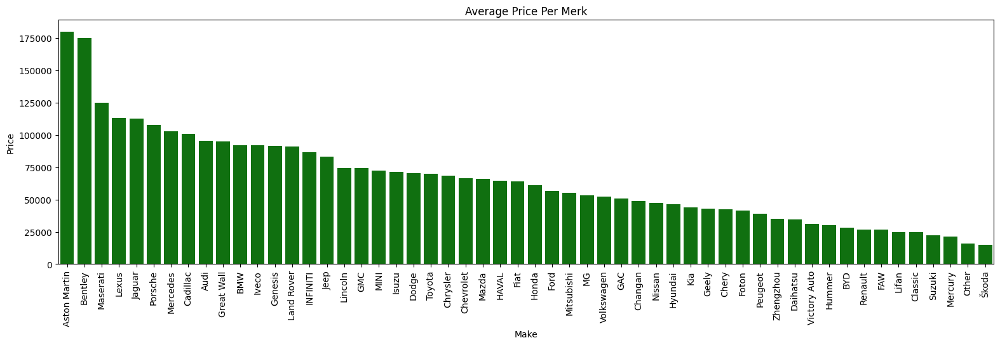

In [42]:
make_avrpr = df.groupby('Make')[['Price']].mean().sort_values(by= 'Price',ascending = False)

plt.figure(figsize=(19,5))
sns.barplot(make_avrpr['Price'],color= 'green')
plt.title('Average Price Per Merk')
plt.xticks(rotation = 90);

Insight : 
- Jika kita lihat dari merk mobilnya, Aston martin dan Bentley merupakan mobil bekas dengan rata-rata harga tertinggi lebih dari 165.000 SAR, Mobil dengan rata-rata penjualan paling rendah adalah dimulai dari Suzuki hingga Skoda. Hal ini menunjukan jika penjualan merk mobil ini memiliki segmentasi tersendiri pada setiap merknya. kita tahu jika Aston Martin merupakan mobil paling sedikit terjual, karena memang Aston Martin di identifikasi sebagai mobil kelas atas (Prestige). Sedangkan untuk toyota dengan penjualan tertinggi hanya memiliki harga rata - rata mobil yang berada di peringkat tengah karena memang segmen yang dijangkau lebih luas, jika lihat Toyota sendiri cenderung mengusung konsep mobil keluarga yang banyak diminati untuk masyarakat kelas menengah dimana melihat mobil secara kebutuhan untuk berpergian bersama keluarga dibanding sebagai barang mewah (Nilai Prestige -nya)

-------

#### Sebelum Masuk ke Modelling dapat kita simpulkan secara keseluruhan : 

Feature Numeric : <br>
- **`Year`**, **`Engine_Size`** dan **`Mileage`** sesuai hasil yang ditunjukkan dalam correlation matrix didapatkan hubungan antara ketiga variabel tersebut dengan fitur **`Price`**.

Feature Categoric: <br>
- **`Type`**, **`Region`**, **`Make`**, **`Gear_type`**, **`Origin`** dan **`Options`** sesuai hasil yang ditunjukkan dalam explore data dapat disimpulkan bahwa perbedaan nilai dalam masing - masing variabel tersebut memiliki pengaruh terhadap rata - rata harga mobil bekas di Arab Saudi. Oleh karena itu variabel - variabel tersebut akan digunakan untuk modeling namun sebelum itu akan dilakukan encoding agar data dapat diolah dalam modelling nantinya.

Dengan melihat permasalahan awal yang telah diidentifikasi bahwa bagaimana mendapatkan harga yang sesuai dari seluruh feature/variabel yang ada guna meningkatkan keuntungan bagi perusahaan, maka dapat disimpulkan hingga proses ini hanya feature **`Negotiable`** saja yang tidak relevan untuk digunakan ke tahap selanjutnya, sedangkan untuk fitur sisanya dapat diidentifikasi adanya hubungan antara variabel dengan fitur **`Price`**. Oleh karena itu untuk variabel yang memiliki hubungan dengan fitur **`Price`** akan diolah untuk digunakan dalam model machine learning untuk menyelesaikan permasalahan dalam menentukan harga mobil yang sesuai dengan spesifikasi yang di sebutkan sebelumnya.

# **Modelling**

In [43]:
# Preprocessing 
from category_encoders import BinaryEncoder, OrdinalEncoder
from sklearn. preprocessing import OneHotEncoder, MinMaxScaler, RobustScaler, StandardScaler

from sklearn.experimental import enable_iterative_imputer
from sklearn.experimental import enable_halving_search_cv

from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, KFold, cross_val_score

# Tunning Paramaeter
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline

# Modelling
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor

# Model evaluation
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error


## Feature and targeting
Pemisahan antara target dengan feature dimana **Feature** disini berisikan 'Type', 'Region', 'Make', 'Gear_Type', 'Origin', 'Options', 'Year',
'Engine_Size', 'Mileage', dan **Target** disini merupakan 'Price'

In [44]:

feature = df.drop( columns = 'Price')
target = df['Price']


## Splitting Data
Melakukan splitting data menjadi data train dan data testing dimana
 * x_train = feature train -> digunakan untuk pelatihan data dalam modelling
 * y_train = target train -> digunakan untuk pelatihan data dalam modelling
 * x_test = feature testing -> digunakan untuk testing data dalam modelling
 * y_test = target testing -> digunakan untuk testing data dalam modelling


In [45]:
# Splitt x train dan x test 
x_train, x_test , y_train, y_test = train_test_split(feature, target, test_size= 0.2, random_state= 48)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(2783, 9)
(2783,)
(696, 9)
(696,)


disini data dibagi dengan proporsi 80% untuk training dan 20% untuk melakukan testing. Pembagian data disini diharapkan agar model dapat mempelajari untuk melakukan prediksi dengan training terlebih dahulu, lalu dilanjutkan untuk memprediksi data testingnya. Rasio 80:20 merupakan rasio yang umum digunakan untuk membagi data train dan test. Rasio ini dianggap cukup untuk memberikan akurasi yang baik dan tidak terlalu banyak menghabiskan waktu dan sumber daya. 

Source : A Gentle Introduction to Machine Learning oleh Andrew Ng

## Encoding dan Scalling

Melakukan tranformer disini yang pertama perlu diperhatikan adalah type data dari setiap kolom di dataset, karena dataset yang sudah bersihkan ini memiliki beberapa kolom dengan jenis data kategori dan numerik maka : 

- 'Gear_Type','Origin','Options' -> Encoding dengan OneHot, karena value dari feature ini merupakan data kategori, Onehotencoder mengubah data kategori menjadi data numerik dengan cara membuat satu kolom baru untuk setiap kategori. Nilai dalam kolom tersebut adalah 1 jika data tersebut termasuk dalam kategori tersebut, dan 0 jika tidak.

- 'Type','Region','Make' -> Encode dengan Binary, karena value dari data ini merupakan data kategori dan memiliki banyak kategori, binary encoding digunakan untuk encoding variabel nominal yang memiliki terlalu banyak kategori. 

- 'Engine_Size', 'Mileage', 'Price' -> Scaling dengan menggunakan robust scaler, penggunaan scaling ini karena data yang clean masih terdapat beberapa outlier.

In [46]:
# Membuat objek transformer 

transformer = ColumnTransformer(transformers =[
    ('OHEencoder', OneHotEncoder(drop= 'first'), ['Gear_Type','Origin','Options']),
    ('BinaryEncoder',BinaryEncoder(),['Type','Region','Make']),
    ('Scalling', RobustScaler(), feature.select_dtypes('number').columns)
],remainder= 'passthrough')

transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('OHEencoder', OneHotEncoder(drop='first'),
                                 ['Gear_Type', 'Origin', 'Options']),
                                ('BinaryEncoder', BinaryEncoder(),
                                 ['Type', 'Region', 'Make']),
                                ('Scalling', RobustScaler(),
                                 Index(['Year', 'Engine_Size', 'Mileage'], dtype='object'))])

### Model : Benchmark
Pada model benchmark kali ini akan membandingkan hasil performa model dengan penilaian RMSE, MAE dan MAPE. Tetapi, penggunaan evaluation metrics ini di fokuskan kepada RMSE karena berdasarkan bisnis konteks untuk mendapatkan akurasi prediksi dari setiap model yang akan dicoba nantinya. 

* RMSE adalah metode pengukuran dengan mengukur perbedaan nilai dari prediksi sebuah model sebagai estimasi atas nilai yang diobservasi. Keakuratan metode estimasi kesalahan pengukuran ditandai dengan adanya nilai RMSE yang kecil. Dengan didapatkannya RMSE dengan nilai yang kecil diharapkan model dapat melakukan prediksi harga mobil secara akurat dengan error antara nilai prediksi dengan nilai seharusnya yang sangat kecil.

* MAE adalah rata-rata selisih mutlak nilai sebenarnya dengan nilai prediksi. MAE menunjukkan nilai kesalahan atau perbedaan nilai sebenarnya dengan nilai prediksi. Semakin kecil nilai MAE, semakin baik model tersebut dalam melakukan prediksi. Dengan didapatkannya MAE dengan nilai yang kecil diharapkan model dapat melakukan prediksi harga mobil dengan baik dengan nilai error mutlak antara nilai prediksi dengan nilai seharusnya yang sangat kecil.

* MAPE adalah presentase atas nilai error mutlak / MAE. MAPE mengukur presentase error mutlak MAE dengan nilai rentang datanya. Dengan MAPE nilai error dapat terbaca dengan lebih mudah apakah besar atau kecil, karena besar kecilnya nilai error tergantung dari rentang datanya. Semakin kecil nilai presentasi kesalahan (percentage error) pada MAPE maka semakin akurat hasil prediksi tersebut. Dengan didapatkannya MAE dengan nilai yang kecil diharapkan model dapat melakukan prediksi harga mobil dengan baik dengan nilai presentase error mutlak antara nilai prediksi dengan nilai seharusnya yang sangat kecil.

Model yang akan dibandingkan yaitu terdapat 5 model yaitu:

1. Linear regression
2. KNN
3. Decision Tree
4. Random Forest
5. XGBoost

Dari kelima model tersebut akan dipilih 2 model terbaik yang memberikan nilai RMSE, MAE dan MAPE yang kecil dan standar deviasi dari RMSE, MAE dan MAPE yang kecil juga. Selain membandingkan model ML yang akan digunakan, akan dibandingkan juga metode dari scaling yang akan digunakan yang mampu memberikan kinerja yang paling baik pada RMSE, MAE dan MAPE. Metode scaling yang akan dibandingkan yaitu:

1. Standard Scaler
2. Min Max Scaler
3. Robust Scaler

In [47]:
# Algoritma ML yang digunakan
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=48)
rf = RandomForestRegressor(random_state=48)
xgb = XGBRegressor(random_state=48)

models = [lr, knn, dt, rf, xgb]

# # Scaling data
# S_scaler = StandardScaler()
# M_scaler = MinMaxScaler()
# R_scaler = RobustScaler()

In [48]:
# Funsi Model Cross Validation

score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

crossval = KFold(n_splits=5, shuffle=True, random_state=48)

for model in models:
    estimator = Pipeline([
        ('Preprocessing', transformer),
        ('model', model)
    ])

    # RMSE
    model_cv_rmse = cross_val_score(
        estimator,
        x_train,
        y_train,
        cv=crossval,
        scoring='neg_root_mean_squared_error',
        error_score='raise'
    )
    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(-model_cv_rmse.mean())  # Negate the values for RMSE
    nilai_std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        estimator,
        x_train,
        y_train,
        cv=crossval,
        scoring='neg_mean_absolute_error',
        error_score='raise'
    )
    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(-model_cv_mae.mean())  # Negate the values for MAE
    nilai_std_mae.append(model_cv_mae.std())

    # MAPE
    model_cv_mape = cross_val_score(
        estimator,
        x_train,
        y_train,
        cv=crossval,
        scoring='neg_mean_absolute_percentage_error',
        error_score='raise'
    )
    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(-model_cv_mape.mean())  # Negate the values for MAPE
    nilai_std_mape.append(model_cv_mape.std())


In [49]:
# Create DataFrame
train_score = pd.DataFrame({
    'Model': ['Linear Regression', 'KNN Regressor', 'DecisionTree Regressor', 'RandomForest Regressor', 'XGBoost Regressor'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

train_score

,Model,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
0,Linear Regression,27538.143811,559.784292,20362.687120,506.445174,0.452003,0.033582
1,KNN Regressor,21729.277516,945.365934,15001.302782,600.061711,0.333539,0.014408
2,DecisionTree Regressor,25571.154457,2539.114432,16203.256956,1262.152854,0.317614,0.019425
3,RandomForest Regressor,18649.406501,1322.394810,12339.830009,838.057992,0.258580,0.019826
4,XGBoost Regressor,17440.752014,1110.248084,11618.349051,709.056145,0.235018,0.019181


* Jika menggunakan Robust Scaler, Dapat disimpulkan jika XGBoost Regressor menempati urutan pertama sebagai model yang baik jika kita menfokuskan di RMSE, MAE, dan MAPE, tetapi tidak lebih stabil jika dilihat dari standar deviasinya dari pada Linear Regression berdasarakan nilai Standar deviasi RMSE, MAE, dan, MAPE.

* Kedua tertinggi merupakan RandomForest Regressor jika dilihat RMSE, MAE, dan MAPE, tetapi tidak lebih stabil jika dilihat dari standar deviasinya dari pada Linear regression di RMSE, MAE, dan MAPEnya. 

Selanjutnya kita akan mengeliminasi menjadi 2 model terbaik berdasarkan akurasi yang dinilai dari RMSE, MAE, dan MAPE, Yakni **XGBoost Regressor** & **RandomForest Regressor**.	

### **Menentukan Model terbaik Antara Standard Scaler, MinMax Scaler, dan Robust Scaler dengan menggunakan Grid Search**

In [50]:
models = [rf, xgb] # 2 Model terbaik

estimator = Pipeline([
        ('preprocessing', transformer),
        ('model', None)
        ])

param_space = {
    'model' : models,
    'preprocessing__Scalling' : [MinMaxScaler(),RobustScaler(),StandardScaler()]
}

crossval = KFold(n_splits=5, shuffle=True, random_state=48)

# Hyperparameter tuning
gridsearch_scaler = GridSearchCV(
    estimator = estimator,
    param_grid = param_space,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_root_mean_squared_error',
    return_train_score= True
)

Grid search adalah teknik optimasi hyperparameter yang paling sederhana yang bekerja dengan mencoba semua kombinasi nilai hyperparameter yang telah ditentukan sebelumnya.

Dalam modeling disini parameter Gridsearch digunakan untuk mencari scaler mana yang memiliki skor metriks evaluation terbaik. Parameter disini ditentukan berdasarkan 2 model terbaik yang sudah ditentukan sebelumnya dan 3 scaler pilihan yakni Minmax, Standard, dan, Robust Scaler.

In [51]:
gridsearch_scaler.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:28: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(cols):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/util

GridSearchCV(cv=KFold(n_splits=5, random_state=48, shuffle=True),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('OHEencoder',
                                                                         OneHotEncoder(drop='first'),
                                                                         ['Gear_Type',
                                                                          'Origin',
                                                                          'Options']),
                                                                        ('BinaryEncoder',
                                                                         BinaryEncoder(),
                                                                         ['Type',
                                                                          'Region',
                                                                          'Make']),
                                                                        ('Scalling',
                                                                         RobustScaler(),
                                                                         Index(['Year', 'Engine_Size...
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=None, n_jobs=None,
                                                num_parallel_tree=None,
                                                random_state=48, ...)],
                         'preprocessing__Scalling': [MinMaxScaler(),
                                                     RobustScaler(),
                                                     StandardScaler()]},
             refit='neg_root_mean_squared_error', return_train_score=True,
             scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error'])

In [52]:
print('Best Params :',gridsearch_scaler.best_params_)
print('Best Score :',gridsearch_scaler.best_score_)

Best Params : {'model': XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=48, ...), 'preprocessing__Scalling': MinMaxScaler()}
Best Score : -17440.752013539844


In [53]:
result = pd.DataFrame(gridsearch_scaler.cv_results_)[['param_model','param_preprocessing__Scalling','rank_test_neg_root_mean_squared_error','mean_test_neg_root_mean_squared_error','std_test_neg_root_mean_squared_error',\
    'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error',
       'std_test_neg_mean_absolute_percentage_error']].sort_values('rank_test_neg_root_mean_squared_error').head(15)
result

,param_model,param_preprocessing__Scalling,rank_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
3,"XGBRegressor(base_score=None, booster=None, ca...",MinMaxScaler(),1,-17440.752014,1110.248084,-11618.349051,709.056145,-0.235018,0.019181
4,"XGBRegressor(base_score=None, booster=None, ca...",RobustScaler(),1,-17440.752014,1110.248084,-11618.349051,709.056145,-0.235018,0.019181
5,"XGBRegressor(base_score=None, booster=None, ca...",StandardScaler(),1,-17440.752014,1110.248084,-11618.349051,709.056145,-0.235018,0.019181
2,RandomForestRegressor(random_state=48),StandardScaler(),4,-18644.176271,1323.560937,-12337.613673,843.885280,-0.258482,0.019920
0,RandomForestRegressor(random_state=48),MinMaxScaler(),5,-18648.972970,1320.333362,-12343.555473,838.387388,-0.258501,0.019744
1,RandomForestRegressor(random_state=48),RobustScaler(),6,-18649.406501,1322.394810,-12339.830009,838.057992,-0.258580,0.019826


Kesimpulan :
 
Nilai-nilai Mean_RMSE, Mean_MAE, dan Mean_MAPE yang lebih rendah menunjukkan performa model yang lebih baik, sedangkan nilai-nilai Std_RMSE, Std_MAE, dan Std_MAPE yang lebih rendah menunjukkan stabilitas performa model yang lebih baik.
Terdapat perbedaan cukup signifikan antara nilai RMSE dan MAE, di mana nilai RMSE lebih tinggi karena nilai residuals atau error-nya dikuadratkan terlebih dahulu sebelum dirata-ratakan. Hal ini menyebabkan RMSE akan memberikan 'weight' yang lebih tinggi untuk nilai error yang besar. Dengan kata lain, terdapat nilai-nilai error yang besar yang dihasilkan oleh semua algoritma yang digunakan, sehingga ada perbedaan signifikan antara nilai RMSE dan MAE. Penggunaan RMSE disini lebih sering daripada MAE dalam kasus-kasus di mana outlier penting untuk diperhatikan. Dalam kasus memprediksi harga mobil bekas, outlier dapat berupa mobil-mobil yang memiliki spesifikasi yang sangat berbeda dari mobil-mobil lainnya. 

* Jika kita lihat dari percobaan dari membandingkan metode scaler sebelumnya antara Standard, MinMax, dan Robust Scaler, dapat disimpulkan jika metode min max scaler mampu memberikan rata - rata nilai RMSE, MAE dan MAPE yang paling baik, perlu ditinjau kembali jika kita melihat standard deviasi  di RMSE, MAE dan MAPE, Masing - masing jika dilihat dari ketiga scaler menunjukan jika XGboost merupakan model yang stabil.

* Berdasarkan RMSE, MAE dan MAPE serta metode scaler MinMax, Robust, dan, Standard, **XGBoost** menjadi model ML **yang paling baik** walaupun sudah feature enginering dengan mengubah proses scalingnya. Urutan selanjutnya ditempati oleh Random Forest dengan Standard Scaler. Selanjutnya model **XGboost** ini akan dilanjutkan untuk tahap prediksi `Price` berdasarkan feature yang sudah di tentukan sebelumnya.

### XGboost
XGBoost (eXtreme Gradient Boosting) adalah algoritma machine learning yang termasuk dalam keluarga algoritma ensemble, khususnya algoritma gradient boosting. Gradient boosting adalah teknik yang menggabungkan beberapa model lemah (weak learners), seperti pohon keputusan agar menjadi suatu model yang kuat/bertenaga (strong learner) secara iteratif. XGBoost merupakan pengembangan algoritma Gradient Boosting Machine (GBM) dengan beberapa fitur tambahan yang berguna dalam mempercepat proses komputasi dan mencegah terjadinya overftting. XGBoosting Regressor adalah implementasi dari XGBoost yang dirancang khusus untuk masalah regresi.

### Predict Sebelum tuning menggunakan model yang dipilih

In [54]:
# Model XGBoost
model = {'XGBRegressor Test': XGBRegressor(random_state=48)}

# Define model terhadap estimator terbaik
xgb_tuning = gridsearch_scaler.best_estimator_

# Fitting model
xgb_tuning.fit(x_train, y_train)

# Predict test set
y_pred_xgb_beforetune = xgb_tuning.predict(x_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_xgb_tuning = np.sqrt(mean_squared_error(y_test, y_pred_xgb_beforetune))
mae_xgb_tuning = mean_absolute_error(y_test, y_pred_xgb_beforetune)
mape_xgb_tuning = mean_absolute_percentage_error(y_test, y_pred_xgb_beforetune)

score_before_tuning = pd.DataFrame({'RMSE': rmse_xgb_tuning, 'MAE': mae_xgb_tuning, 'MAPE': mape_xgb_tuning}, index=model.keys())
score_before_tuning

,RMSE,MAE,MAPE
XGBRegressor Test,15865.530871,10829.690434,0.231909


Berdasarkan hasil diatas dapat dilihat jika prediksi terbaik sebelum melakukan tuning pada model XGboost untuk memprediksi `Price` jika dilihat dari RMSE, MAE, dan MAPE nya. Maka dari itu kesimpulan yang bisa diambil disini **XGboost** merupakan model yang akan di tuning nantinya untuk meningkatkan performance memprediksi harga mobil bekas sesuai dengan bisnis konteks yang sudah ditentukan.

## Hyper Parameter Tuning XGboost

Melakukan tuning pada model disini diharapkan mampu meningkatkan performance dari model yang sudah kita tentukan tadi yakni XGBoost.<br>
Menentukan tuning parameter untuk XGboost, Apa saja yang perlu diperhatikan ? 



> **1. Learning rate** : <br> menentukan seberapa besar perubahan yang dilakukan pada model pada setiap iterasi. Nilai learning rate yang terlalu tinggi dapat menyebabkan model overfitting, sedangkan nilai learning rate yang terlalu rendah dapat menyebabkan model underfitting. Nilai learning rate yang umum digunakan adalah 0.01 hingga 0.1. Nilai learning rate yang lebih rendah akan menyebabkan model lebih stabil, tetapi akan membutuhkan waktu yang lebih lama untuk mencapai akurasi yang optimal.

> **2. n_estimators** : <br>
menentukan jumlah pohon yang dibangun oleh model. Nilai n_estimators yang terlalu kecil dapat menyebabkan model kurang akurat, sedangkan nilai n_estimators yang terlalu besar dapat menyebabkan model overfitting. Nilai n_estimators yang umum digunakan adalah 100 hingga 1000. Nilai n_estimators yang lebih tinggi akan meningkatkan akurasi prediksi, tetapi juga akan meningkatkan risiko overfitting.

>**3. max_depth**: <br> menentukan kedalaman maksimum dari setiap pohon. Nilai max_depth yang terlalu tinggi dapat menyebabkan model overfitting, sedangkan nilai max_depth yang terlalu rendah dapat menyebabkan model kurang akurat. Nilai max_depth yang umum digunakan adalah 3 hingga 10. Nilai max_depth yang lebih tinggi akan meningkatkan akurasi prediksi, tetapi juga akan meningkatkan risiko overfitting.

>**4. min_child_weight** :<br> menentukan jumlah minimum data yang harus ada di setiap daun pohon. Nilai min_child_weight yang terlalu tinggi dapat menyebabkan model underfitting, sedangkan nilai min_child_weight yang terlalu rendah dapat menyebabkan model overfitting. Nilai min_child_weight yang umum digunakan adalah 1 hingga 5. Nilai min_child_weight yang lebih tinggi akan membuat model lebih stabil, tetapi juga akan mengurangi akurasi prediksi.

>**5. gamma** :<br> menentukan seberapa besar pengaruh suatu fitur terhadap keputusan yang diambil oleh model. Nilai gamma yang terlalu tinggi dapat menyebabkan model underfitting, sedangkan nilai gamma yang terlalu rendah dapat menyebabkan model overfitting. Nilai gamma yang umum digunakan adalah 0.01 hingga 0.2. Nilai gamma yang lebih tinggi akan membuat model lebih sensitif terhadap fitur, tetapi juga akan meningkatkan risiko overfitting.

>**6. subsample** :<br> menentukan persentase data yang digunakan untuk membangun setiap pohon. Nilai subsample yang terlalu rendah dapat menyebabkan model underfitting, sedangkan nilai subsample yang terlalu tinggi dapat menyebabkan model overfitting. Nilai subsample yang umum digunakan adalah 0.8 hingga 1. Nilai subsample yang lebih tinggi akan membuat model lebih efisien, tetapi juga akan mengurangi akurasi prediksi.

>**7. colsample_bytree** :<br> menentukan persentase fitur yang digunakan untuk membangun setiap pohon. Nilai colsample_bytree yang terlalu rendah dapat menyebabkan model underfitting, sedangkan nilai colsample_bytree yang terlalu tinggi dapat menyebabkan model overfitting. Nilai colsample_bytree yang umum digunakan adalah 0.8 hingga 1. Nilai colsample_bytree yang lebih tinggi akan membuat model lebih efisien, tetapi juga akan mengurangi akurasi prediksi.

Source : 
- Chen, Tianqi, and Carlos Guestrin. "Xgboost: A scalable tree boosting system." *Proceedings of the 22nd acm sigkdd international conference on knowledge discovery and data mining.* 2016. 
- https://xgboost.readthedocs.io/en/stable/parameter.html

In [55]:
estimator = Pipeline([
        ('preprocessing', transformer),
        ('model', None)
        ])

param_space_xgb = {
    'model' : [XGBRegressor(random_state = 48)], 
    'model__learning_rate': [0.01,0.1], # memberi perubahan pada leraning rate 
    'model__n_estimators' : [100],
    'model__max_depth': [5,6,7], #memberi perubahan pada max depth
    'model__min_child_weight': [1,3,5], 
    'model__gamma' : [0.01,0.2],
    'model__subsample' : [0.8,1],
    'model__colsample_bytree': [0.8,1],
    'preprocessing__Scalling' : [MinMaxScaler(),RobustScaler(),StandardScaler()]
}

crossval = KFold(n_splits=5, shuffle=True, random_state=48)

# Hyperparameter tuning
best_xgb = GridSearchCV(
    estimator = estimator,
    param_grid = param_space_xgb,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_root_mean_squared_error',
    return_train_score= True
)

In [56]:
best_xgb.fit(x_train,y_train)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:28: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(cols):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/util

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:28: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(cols):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/util

GridSearchCV(cv=KFold(n_splits=5, random_state=48, shuffle=True),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('OHEencoder',
                                                                         OneHotEncoder(drop='first'),
                                                                         ['Gear_Type',
                                                                          'Origin',
                                                                          'Options']),
                                                                        ('BinaryEncoder',
                                                                         BinaryEncoder(),
                                                                         ['Type',
                                                                          'Region',
                                                                          'Make']),
                                                                        ('Scalling',
                                                                         RobustScaler(),
                                                                         Index(['Year', 'Engine_Size...
                         'model__max_depth': [5, 6, 7],
                         'model__min_child_weight': [1, 3, 5],
                         'model__n_estimators': [100],
                         'model__subsample': [0.8, 1],
                         'preprocessing__Scalling': [MinMaxScaler(),
                                                     RobustScaler(),
                                                     StandardScaler()]},
             refit='neg_root_mean_squared_error', return_train_score=True,
             scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error'])

In [57]:
print('Best Params:',best_xgb.best_params_)
print("")
print('Best score:', best_xgb.best_score_)

Best Params: {'model': XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=48, ...), 'model__colsample_bytree': 0.8, 'model__gamma': 0.01, 'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__min_child_weight': 3, 'model__n_estimators': 100, 'model__subsample': 0.8, 'preprocessing__Scalling': MinMaxScaler()}

In [58]:
pd.DataFrame(best_xgb.cv_results_)[['param_model','param_preprocessing__Scalling','rank_test_neg_root_mean_squared_error','mean_test_neg_root_mean_squared_error','std_test_neg_root_mean_squared_error',\
    'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error',
       'std_test_neg_mean_absolute_percentage_error']].sort_values('rank_test_neg_root_mean_squared_error').head(1)

,param_model,param_preprocessing__Scalling,rank_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
206,"XGBRegressor(base_score=None, booster=None, ca...",StandardScaler(),1,-16807.743542,983.014281,-11154.982629,544.444418,-0.230175,0.016285


Dari hasil melakukan beberapa kali experiment dapat ditarik kesimpulan jika best parameter setelah melakukan tuning model XGboost dengan Gridsearch adalah sebagai berikut : 

1. colsample_bytree : 0.8
2. gamma : 0.01 
3. learning_rate : 0.1 
4. max_depth : 7
5. min_child_weight : 3 
6. n_estimators : 100 
7. subsample : 0.8

Score terbaik pada Tuningan model XGBoost disini adalah `-16807.743541547272` secara RMSE<br>

Note :
Perlu digarisbawahi jika hasil dari melakukan tuning ini berdasarkan pertimbangan argumen yang sudah dijelaskan sebelumnya. Sehingga hal ini tentunya akan jadi limitasi pada pembentukan model juga terkait akurasi dan kestabilan model yang dipakai.

### Predict Setelah Tuning XGBoost

In [59]:
# Model XGBoost
model = {'XGBRegressor': XGBRegressor(random_state=48)}

# Define model terhadap estimator terbaik
xgb_tuning = best_xgb.best_estimator_

# Fitting model
xgb_tuning.fit(x_train, y_train)

# Predict test set
y_pred_xgb_tuning = xgb_tuning.predict(x_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_xgb_tuning = np.sqrt(mean_squared_error(y_test, y_pred_xgb_tuning))
mae_xgb_tuning = mean_absolute_error(y_test, y_pred_xgb_tuning)
mape_xgb_tuning = mean_absolute_percentage_error(y_test, y_pred_xgb_tuning)

score_after_tuning = pd.DataFrame({'RMSE': rmse_xgb_tuning, 'MAE': mae_xgb_tuning, 'MAPE': mape_xgb_tuning}, index=model.keys())
score_after_tuning

,RMSE,MAE,MAPE
XGBRegressor,15778.439722,10573.817809,0.221048


### Performance Comparison

Di bagian ini menunjukan performance pada model saat melakukan prediksi sebelum melakukan tuning dan setelah melakukan tuning

In [60]:
display(score_before_tuning.rename(index= {'XGBRegressor Test' : 'XGBRegressor_Before_Tuned'}), score_after_tuning.rename(index= {'XGBRegressor' : 'XGBRegressor_After_Tuned'}))

,RMSE,MAE,MAPE
XGBRegressor_Before_Tuned,15865.530871,10829.690434,0.231909


,RMSE,MAE,MAPE
XGBRegressor_After_Tuned,15778.439722,10573.817809,0.221048


Model mengalami peningkatan performa (nilai RMSE, MAE & MAPE berkurang) dengan dilakukannya hyperparameter tuning, walaupun tidak sesignifikan itu.

* RMSE, MAE & MAPE sebelum tuning: 15865.53, 10829.69, 0.231
* RMSE, MAE & MAPE setelah tuning: 15778.43, 10573.81, 0.221

Sekarang kita melihat bagaimana scatter plot menunjukan harga mobil bekas aktual dan prediksi dengan menggunakan model XGboost 

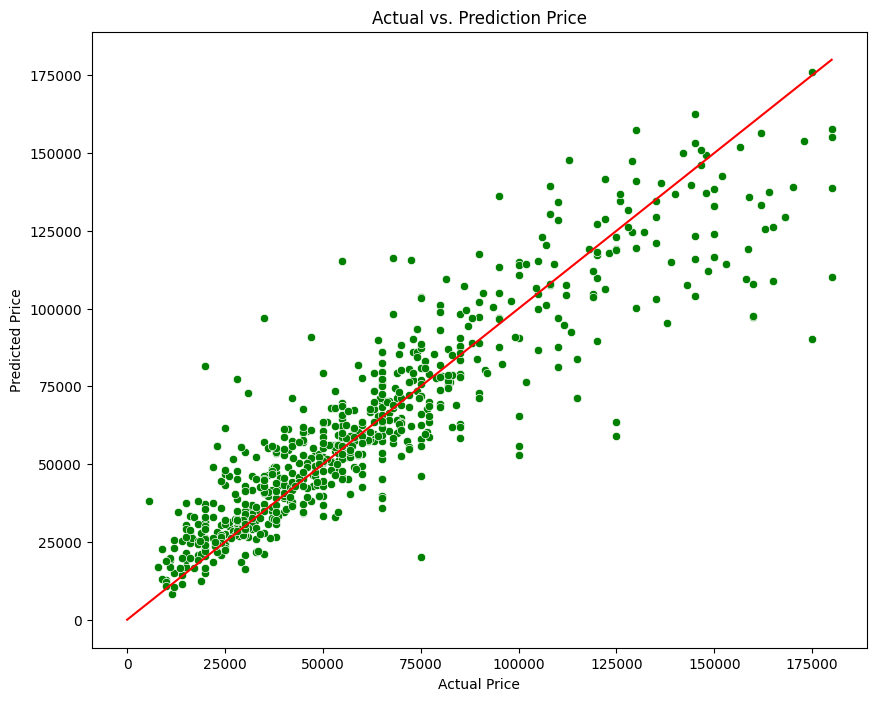

In [61]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x=y_test, y=y_pred_xgb_tuning, color = 'green').set(title='Actual vs. Prediction Price', 
                                                   xlabel='Actual Price', 
                                                   ylabel='Predicted Price')
sns.lineplot(x=list(np.arange(0,180000)), y=list(np.arange(0,180000)), color='red')
plt.show()

In [62]:
residual = pd.DataFrame({'Actual' : y_test,
              'Prediction Price' :y_pred_xgb_tuning})
residual['Residual'] = residual['Prediction Price'] - residual['Actual']

residual['type_est'] = np.where(residual['Residual']< 0, 'Underprice', 'Oveprice')
residual

,Actual,Prediction Price,Residual,type_est
4809,45000,34232.386719,-10767.613281,Underprice
4734,62000,66719.500000,4719.500000,Oveprice
4804,80000,69259.750000,-10740.250000,Underprice
1551,79000,77718.859375,-1281.140625,Underprice
1615,45000,34572.273438,-10427.726562,Underprice
...,...,...,...,...
954,30000,37178.378906,7178.378906,Oveprice
5551,76000,59855.062500,-16144.937500,Underprice
2929,152000,142567.093750,-9432.906250,Underprice
21,76000,80787.187500,4787.187500,Oveprice


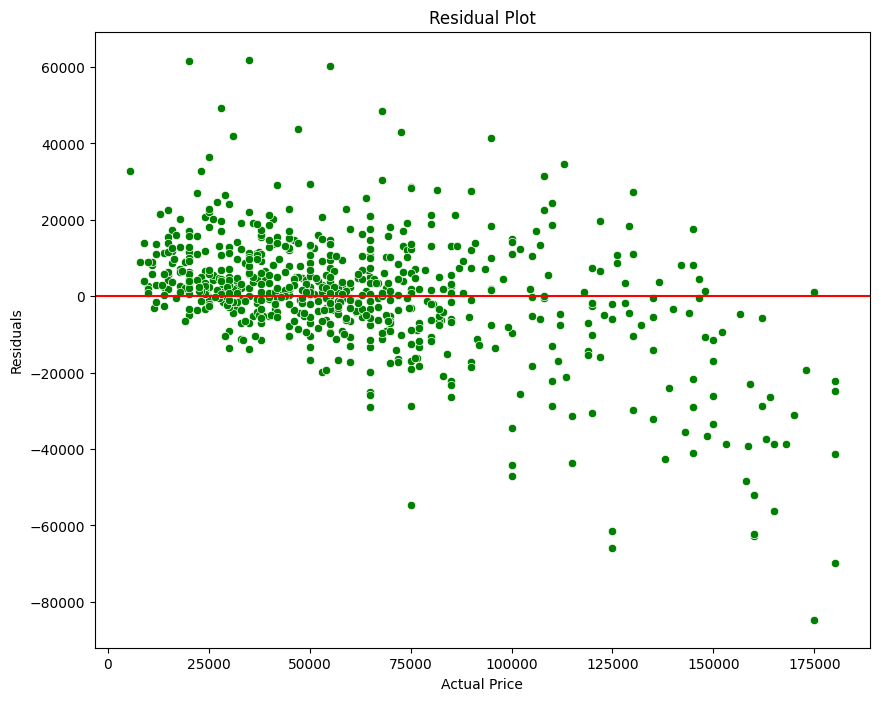

In [63]:
plt.figure(figsize=(10, 8))
residuals = y_pred_xgb_tuning - y_test 
plot = sns.scatterplot(x=y_test, y=residuals, color = 'green').set(title='Residual Plot', 
                                                 xlabel='Actual Price', 
                                                 ylabel='Residuals')
plt.axhline(y=0, color='red')


In [64]:
print(f"Harga yang diprediksi lebih dari nilai aktual (Harga Overprice): {len(residual[residual['Residual'] > 0])}")
print(f"Harga yang diprediksi kurang dari nilai aktual (Harga Underprice) : {len(residual[residual['Residual'] < 0])}")
print(f"Prediksi Overprice tertinggi adalah : {residual[residual['Residual'] > 0]['Residual'].max()}")
print(f"Prediksi Underprice terendah adalah : {residual[residual['Residual'] < 0]['Residual'].min()}")

Harga yang diprediksi lebih dari nilai aktual (Harga Overprice): 393
Harga yang diprediksi kurang dari nilai aktual (Harga Underprice) : 303
Prediksi Overprice tertinggi adalah : 61930.1953125
Prediksi Underprice terendah adalah : -84696.140625


Dalam kasus ini menunjukkan bahwa model XGBRegressor yang digunakan memprediksi harga lebih mahal dari aktual sebanyak 393 data (Overprice), dan memprediksi harga menjadi lebih murah dari aktual sebanyak 303 data (Underprice).

- Dapat di simpulkan bahwa model prediksi harga mobil bekas disini memiliki akurasi yang cukup baik. Hal ini ditunjukkan dengan jumlah prediksi harga yang akurat (overprice atau underprice yang masuk akal) yang lebih banyak daripada jumlah prediksi harga yang tidak akurat.

- Namun, masih terdapat beberapa kasus overprice dan underprice yang tidak masuk akal dan perlu dianalisis lebih lanjut. Berdasarkan hasil residual plot diatas, dapat dilihat bahwa harga mobil bekas yang overprice sekali cenderung terjadi pada harga mobil bekas yang actual nya rendah. 

- Sedangkan harga mobil bekas yang underprice cenderung terjadi pada harga mobil bekas yang aktualnya tinggi. Hal ini mungkin disebabkan oleh beberapa faktor


## Feature Importance

Fungsi `feature_importances_` digunakan untuk mengetahui tingkat pentingnya setiap fitur dalam mempengaruhi target variabel (dalam kasus ini, variabel "price"). Fitur yang memiliki kontribusi yang lebih tinggi dalam memprediksi target akan memiliki skor yang lebih tinggi.

Dengan menggunakan fungsi feature_importances_, kita dapat melihat peringkat fitur-fitur berdasarkan tingkat kepentingannya. Fitur dengan skor yang tinggi menunjukkan bahwa fitur tersebut memiliki pengaruh yang signifikan terhadap target, sedangkan fitur dengan skor rendah memiliki pengaruh yang lebih kecil.

In [65]:
xgb_tuning['model'].feature_importances_

array([0.01458028, 0.02439408, 0.04265375, 0.00113377, 0.02741712,
       0.07537541, 0.01558255, 0.02128946, 0.03514484, 0.02467402,
       0.0182942 , 0.02796615, 0.03020377, 0.02443638, 0.01927388,
       0.00727754, 0.01404578, 0.01306775, 0.01124102, 0.01177963,
       0.025317  , 0.04968725, 0.0410462 , 0.07815906, 0.04442574,
       0.02936252, 0.12539326, 0.12071472, 0.02606295], dtype=float32)

In [66]:
best_xgb.best_estimator_.named_steps['preprocessing'].get_feature_names_out()

array(['OHEencoder__Gear_Type_Manual', 'OHEencoder__Origin_Other',
       'OHEencoder__Origin_Saudi', 'OHEencoder__Origin_Unknown',
       'OHEencoder__Options_Semi Full', 'OHEencoder__Options_Standard',
       'BinaryEncoder__Type_0', 'BinaryEncoder__Type_1',
       'BinaryEncoder__Type_2', 'BinaryEncoder__Type_3',
       'BinaryEncoder__Type_4', 'BinaryEncoder__Type_5',
       'BinaryEncoder__Type_6', 'BinaryEncoder__Type_7',
       'BinaryEncoder__Type_8', 'BinaryEncoder__Region_0',
       'BinaryEncoder__Region_1', 'BinaryEncoder__Region_2',
       'BinaryEncoder__Region_3', 'BinaryEncoder__Region_4',
       'BinaryEncoder__Make_0', 'BinaryEncoder__Make_1',
       'BinaryEncoder__Make_2', 'BinaryEncoder__Make_3',
       'BinaryEncoder__Make_4', 'BinaryEncoder__Make_5', 'Scalling__Year',
       'Scalling__Engine_Size', 'Scalling__Mileage'], dtype=object)

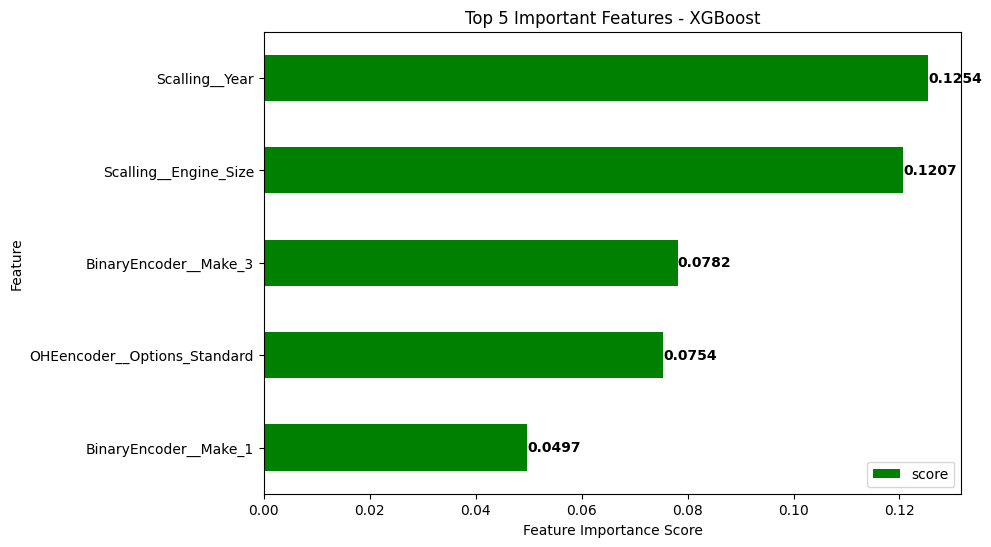

In [67]:

feature_imp = pd.DataFrame()
feature_imp['feature'] = best_xgb.best_estimator_.named_steps['preprocessing'].get_feature_names_out()
feature_imp['score'] = xgb_tuning['model'].feature_importances_
feature_imp = feature_imp.set_index('feature')


top_features = feature_imp.sort_values('score', ascending=True).tail(5)
top_features.plot(kind='barh', figsize=(9, 6), color='green')

# Adding values to the bars
for index, value in enumerate(top_features['score']):
    plt.text(value, index, f'{value:.4f}', ha='left', va='center', color='black', fontweight='bold')

plt.title('Top 5 Important Features - XGBoost')
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.show()


jika dilihat dari barplot dan nilai diatas dapat diidentifikasi jika feature `Year`, `Engine_Size` & `Make` merupakan feature penting yang paling mempengaruhi target `Price`, dan pada feature `Option` tidak terlalu mempengaruhi target.

- Tahun (`Year`) dengan nilai importance **0,1254.** Hal ini menunjukkan bahwa tahun produksi mobil merupakan faktor yang paling penting dalam memprediksi harga mobil bekas. Mobil yang lebih baru umumnya memiliki harga yang lebih tinggi daripada mobil yang lebih tua.
- Ukuran mesin (`Engine_Size`) dengan nilai importance **0,1207.** Hal ini menunjukkan bahwa ukuran mesin mobil juga merupakan faktor yang penting dalam memprediksi harga mobil bekas. Mobil dengan mesin yang lebih besar umumnya memiliki harga yang lebih tinggi.
- Merek (`Make`) dengan nilai importance **0,0782.** Hal ini menunjukkan bahwa merek mobil juga memiliki pengaruh terhadap harga mobil bekas. Mobil dari merek yang lebih terkenal umumnya memiliki harga yang lebih tinggi.
- Opsi (`Options`) dengan nilai importance **0,754.** Hal ini menunjukkan bahwa fitur opsi mobil, seperti standar , semi modifikasi, dan full modifikasi, juga memiliki pengaruh yang signifikan terhadap harga mobil bekas. Mobil dengan opsi yang lebih lengkap tentu memiliki harga yang lebih tinggi.



 94%|=================== | 2613/2783 [00:12<00:00]       

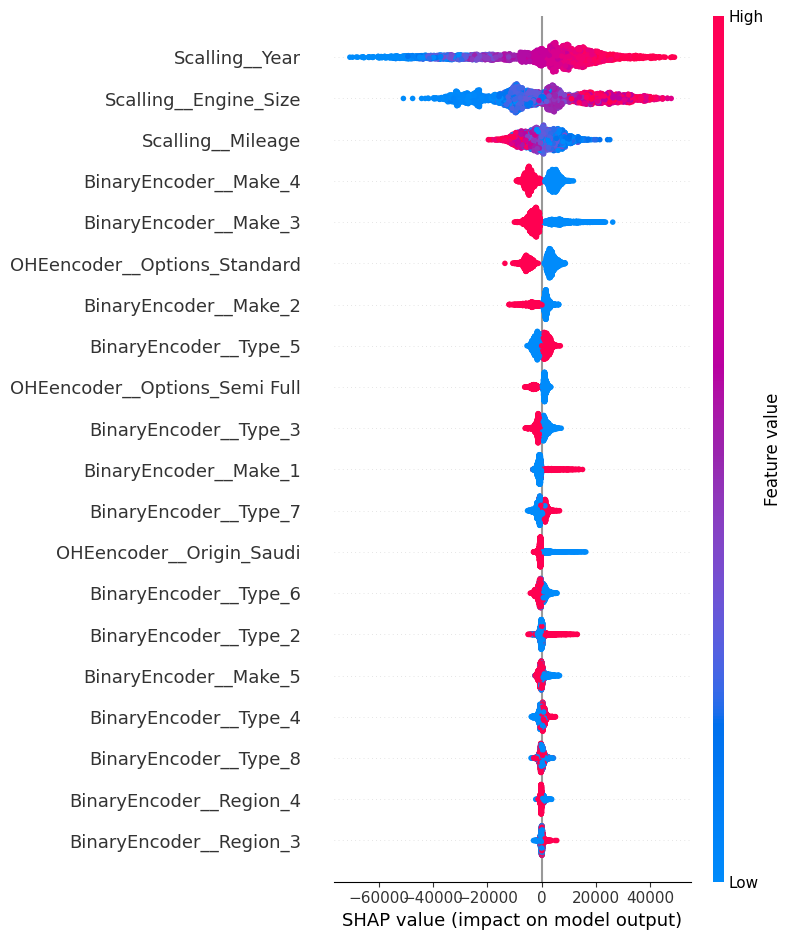

In [68]:
import shap
model_shap = xgb_tuning.named_steps['model']
prep = xgb_tuning.named_steps['preprocessing']
x_test_pre = prep.transform(x_train)
shap_values = shap.TreeExplainer(model_shap,
                                 data = x_test_pre,
                                 model_output="raw").shap_values(x_test_pre)
plt.figure
shap.summary_plot(shap_values, x_test_pre,feature_names = prep.get_feature_names_out())

secara lebih detail mari kita lihat bagaimana SHAP dapat menunjukan fitur mana saja yang mempengaruhi prediksi harga dalam model machine learning yang telah kita tentukan secara rinci dari penyebaran datanya. 
Dari grafik tersebut dapat dilihat bahwa nilai SHAP (Shapley Value of Explanations) untuk feature tahun semakin positif seiring dengan bertambahnya tahun produksi mobil. Artinya, mobil yang lebih baru memiliki harga yang lebih tinggi daripada mobil yang lebih tua. begitu juga dengan engine size dimana semakin besar suatu engine size maka semakin mahal juga prediksi harga yang dibuat model. untuk feature mileage, semakin sedikit total mileage pada mobil maka akan semakin mempengaruhi harga prediksi untuk menjadi mahal.

## Conclusion 

- Best model yang dapat diimplementasikan di data ini adalah XGBoost Regresor degan hyperparameter tuning di : 
    1. colsample_bytree : 0.8
    2. gamma : 0.01 
    3. learning_rate : 0.1 
    4. max_depth : 7
    5. min_child_weight : 3 
    6. n_estimators : 100 
    7. subsample : 0.8 <br>
<br>

- Jika ditarik kesimpulan project ini dapat menggunakan model untuk memprediksi harga mobil bekas dengan limitasi harga yang berkisar antara 5.000 SAR hingga 182.000 SAR saja, lalu jumlah kilometer yang terletak diantara 100.000 Km hingga 900.000 Km (Limitasi).

- Jika dilihat dari feature yang penting, `Year`, `Engine_Size` & `Make` merupakan feature penting yang mempengaruhi terhadap target `Price`.

- Dapat disimpulkan bahwa bila nanti model yang ini digunakan untuk memperkirakan harga mobil pada rentang nilai seperti yang dilatih terhadap model (dengan limitasi `Price` berkisar antara 5.000 SAR hingga 182.000 SAR), maka perkiraan harga rata-rata akan meleset kurang lebih sebesar 15.778,43 SAR (RMSE) dan persentase rata-rata error nya sekitar 22,1% (MAPE) dari harga yang mungkin seharusnya dapat diprediksi. Bahkan dalam model ini pun tidak menuntup kemungkinan jika hasil prediksi bahkan meleset lebih jauh lagi karena masih terdapat bias yang dihasilkan masih cukup tinggi jika kita melihat harga aktual dan prediksinya. Bias yang terjadi ini dalam pemodelan ini karena minimnya feature yang merepresentasikan variasi spesifikasi mobil seperti, termasuk klasik atau tidak mobil ini, terdapat garansi atau tidak, pernah mengalami permasalahan pada mesin atau tidak dan masih masih banyak lagi.

- Tidak hanya itu, Limitasi pada model ini tentu memiliki pengaruh terhadap data testing baru yang nantinya akan digunakan sebagai model prediksi harga mobil. Karena dalam melakukan pemodelan data yang ada disini sudah dibersihkan sesuai dengan pertimbangan, maka hasil prediksi model dapat dikatakan tidak dipercaya. Namun ketika data telah disesuaikan dengan limitasi sebelumnya, maka hasil prediksi dapat dipercaya dengan kesalahan errornya.

- Pada tahap optimasi model, saya juga mencoba mencari model terbaik dari XGBoost dengan memberikan perbedaan proses scaling terhadap feature numeriknya (feature enginering), dan dapat disimpulkan masing-masing scaling tidak memberikan pengaruh terhadap hasil skor jika dilihat dari RMSE.

- Untuk melihat bagaimana model memprediksi data testing apakah underprice atau overprice dapat disimpulkan melalui residualnya. Data yang diprediksi **overprice** berjumlah **393** data, dan yang diprediksi **underprice** berjumlah **303**. Hal ini tentu akan menjawab Goals dari pembuatan model untuk memprediksi harga mobil bekas dimana untuk mencari keuntungan, harga yang cenderung overprice akan baik untuk dijual dan harga yang underprice cenderung baik untuk dibeli lalu dijual kembali dengan melakukan reparasi terlebih dahulu. 

## Recomendation 

- Terkait dengan limitasi untuk dalam pemodelan ini, sebaiknya jumlah data diperbanyak menjadi lebih dari dari 3000an (jumlah data yang sudah dibersihkan), agar model dapat memprediksi harga lebih akurat dari banyaknya variasi data juga. (Penambahan data ini perlu diutamakan terhadap data yang representasi variasinya tergolong sedikit). 

- Penambahan feature baru yang merepresentasikan variasi spesifikasi mobil seperti, apakah mobil ini merupakan jenis mobil klasik, terdapat garansi atau tidaknya, atau kondisi mobil terbaru, yang mempengarahui dalam menentukan harga mobil bekas. 

- Menggunakan Optuna sebagai Hyperparameter tuning optimization untuk improve performance dari model yang dipilih, atau penggunaan model lain untuk meminimalisir error yang dihasilkan.

- Penggunaan model yang lain dengan target baru untuk  mengklasifikasikan apakah mobil yang terjual ini menguntungkan bagi perusahaan atau tidak. Model klasifikasi ini berguna bagi perusahaan untuk memotong cost servis mobil dengan kondisi sangat buruk, atau sebagai bahan pertimbangan mobil tetap diiklankan atau tidak (Marketing Analyst).

- Dengan menunjukkan harga mana saja yang overprice dan underprice akan lebih baik juga bagi perusahaan untuk memberikan pertimbangan khusus harga mana yang dirasa overprice atau underprice yang masuk akal, dengan begitu perusahaan akan mencapai keuntungan dan bagi pelanggan menemukan harga yang sesuai dengan kriteria atau spesifikasi mobilnya. 


------

## Save Model 

In [69]:
import pickle
final_model = xgb_tuning.fit(feature,target)
filename = 'Saudi_model_XGB_Best.sav'
pickle.dump(final_model, open(filename, 'wb'))

In [70]:
model = pickle.load(open(filename,'rb'))

In [71]:
np.sqrt(mean_squared_error(target,model.predict(feature)))

7105.664990642897